# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
# plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
# plt.rcParams['image.interpolation'] = 'nearest'
# plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

In [2]:
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [3]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

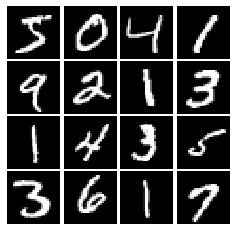

In [4]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [5]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(alpha * x, x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [6]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [7]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform((batch_size, dim), -1, 1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [8]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [9]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(256, input_shape=(784,)),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(1),

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [10]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [11]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(1024, input_shape=(noise_dim,)),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(784),
        tf.keras.layers.Activation('tanh'),

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [12]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count, true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [13]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss = bce(tf.ones_like(logits_real), logits_real) + bce(tf.zeros_like(logits_fake), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss = bce(tf.ones_like(logits_fake), logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [14]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

W1110 12:05:57.288804 4664184256 deprecation.py:323] From /Users/mariolarcher/anaconda3/envs/tf_20_env/lib/python3.7/site-packages/tensorflow/python/ops/nn_impl.py:182: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Maximum error in d_loss: 3.97058e-09


In [15]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [16]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)
    G_solver = tf.optimizers.Adam(learning_rate=learning_rate, beta_1=beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [17]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.643, G:0.6816


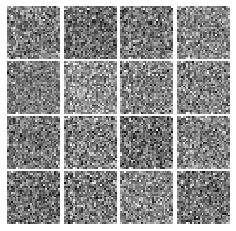

Epoch: 0, Iter: 20, D: 0.5835, G:0.969


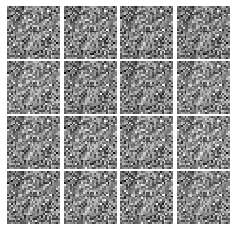

Epoch: 0, Iter: 40, D: 0.586, G:0.9973


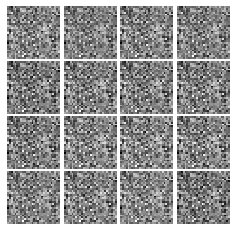

Epoch: 0, Iter: 60, D: 0.2599, G:2.187


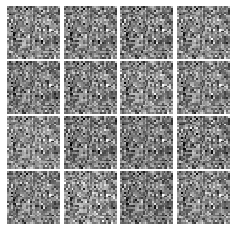

Epoch: 0, Iter: 80, D: 1.436, G:5.059


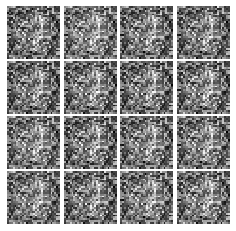

Epoch: 0, Iter: 100, D: 1.26, G:1.273


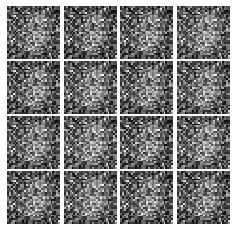

Epoch: 0, Iter: 120, D: 1.898, G:0.7937


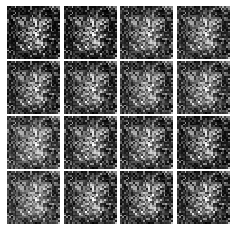

Epoch: 0, Iter: 140, D: 1.505, G:0.7954


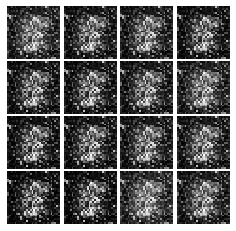

Epoch: 0, Iter: 160, D: 1.111, G:0.773


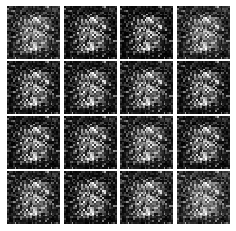

Epoch: 0, Iter: 180, D: 1.343, G:1.456


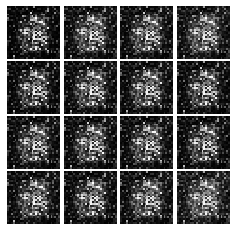

Epoch: 0, Iter: 200, D: 1.073, G:1.663


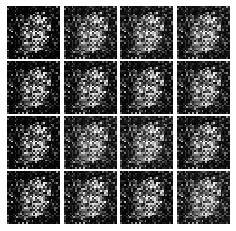

Epoch: 0, Iter: 220, D: 1.396, G:1.534


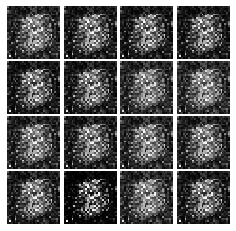

Epoch: 0, Iter: 240, D: 1.372, G:0.806


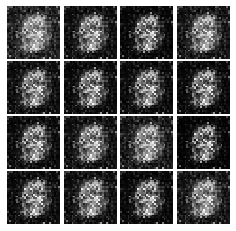

Epoch: 0, Iter: 260, D: 1.618, G:1.492


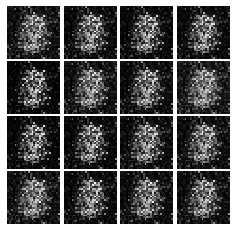

Epoch: 0, Iter: 280, D: 2.225, G:0.7037


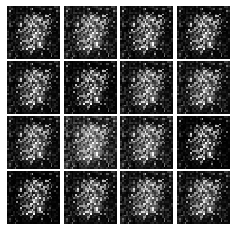

Epoch: 0, Iter: 300, D: 1.334, G:1.196


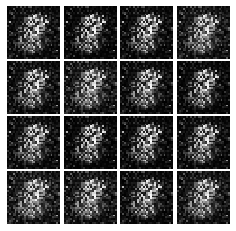

Epoch: 0, Iter: 320, D: 1.666, G:1.511


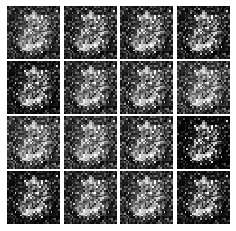

Epoch: 0, Iter: 340, D: 1.584, G:1.12


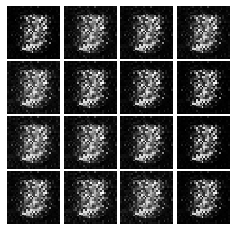

Epoch: 0, Iter: 360, D: 0.9748, G:1.554


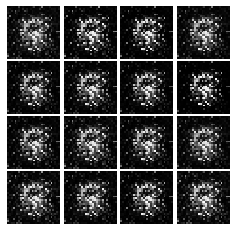

Epoch: 0, Iter: 380, D: 1.328, G:0.9072


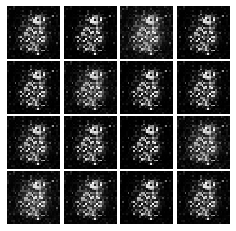

Epoch: 0, Iter: 400, D: 1.324, G:1.098


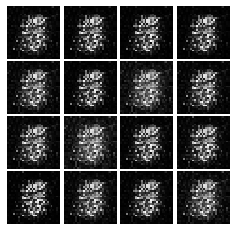

Epoch: 0, Iter: 420, D: 1.161, G:1.745


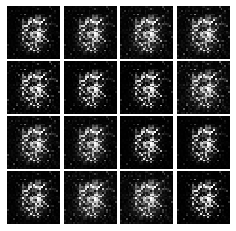

Epoch: 0, Iter: 440, D: 1.605, G:0.8269


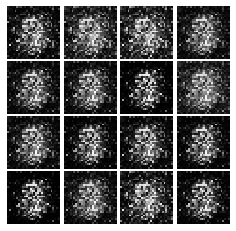

Epoch: 0, Iter: 460, D: 1.209, G:1.234


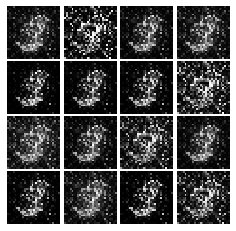

Epoch: 1, Iter: 480, D: 1.394, G:0.8391


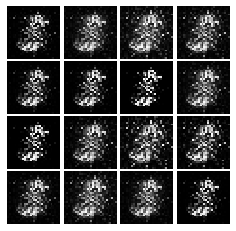

Epoch: 1, Iter: 500, D: 1.244, G:0.1769


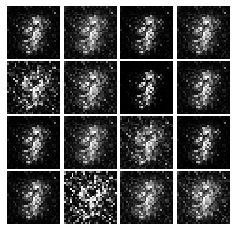

Epoch: 1, Iter: 520, D: 1.039, G:1.504


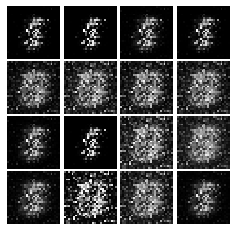

Epoch: 1, Iter: 540, D: 3.477, G:0.7093


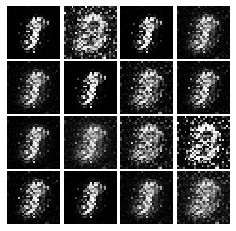

Epoch: 1, Iter: 560, D: 1.069, G:1.352


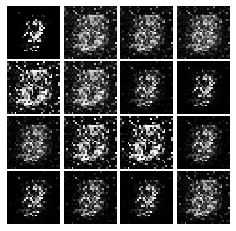

Epoch: 1, Iter: 580, D: 1.454, G:0.1935


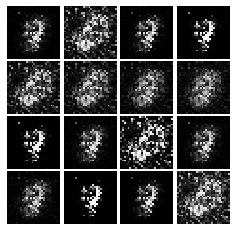

Epoch: 1, Iter: 600, D: 1.287, G:1.486


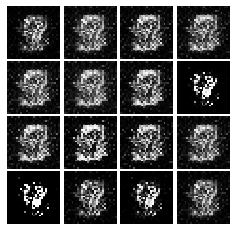

Epoch: 1, Iter: 620, D: 1.026, G:1.058


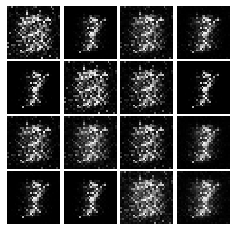

Epoch: 1, Iter: 640, D: 1.22, G:1.433


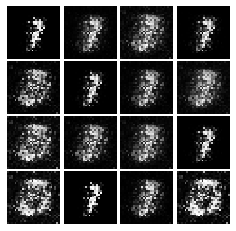

Epoch: 1, Iter: 660, D: 1.093, G:1.677


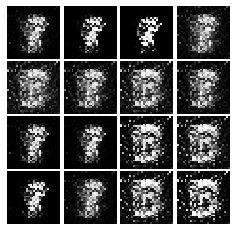

Epoch: 1, Iter: 680, D: 1.012, G:2.226


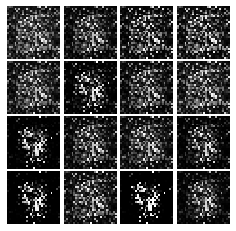

Epoch: 1, Iter: 700, D: 1.281, G:1.847


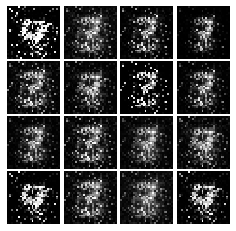

Epoch: 1, Iter: 720, D: 1.521, G:0.7597


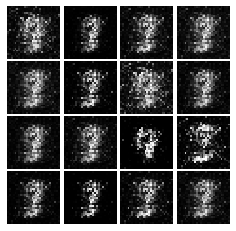

Epoch: 1, Iter: 740, D: 1.175, G:1.012


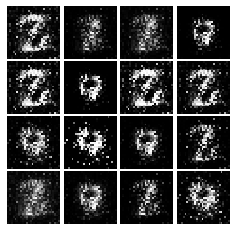

Epoch: 1, Iter: 760, D: 0.9622, G:1.381


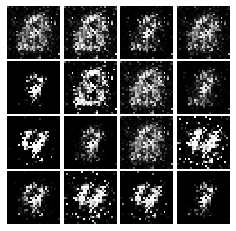

Epoch: 1, Iter: 780, D: 1.112, G:1.299


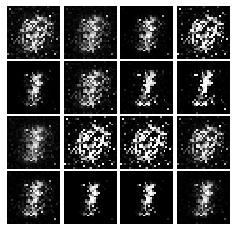

Epoch: 1, Iter: 800, D: 1.051, G:1.745


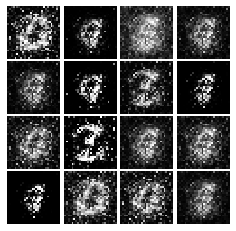

Epoch: 1, Iter: 820, D: 1.068, G:1.303


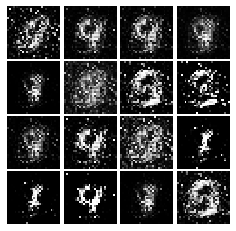

Epoch: 1, Iter: 840, D: 1.189, G:1.331


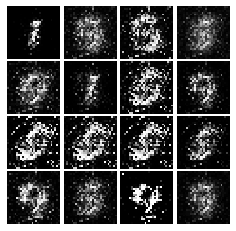

Epoch: 1, Iter: 860, D: 1.229, G:0.9728


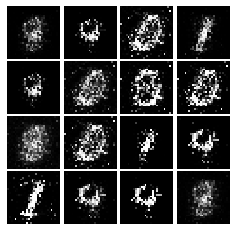

Epoch: 1, Iter: 880, D: 1.304, G:0.9512


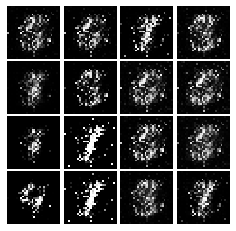

Epoch: 1, Iter: 900, D: 0.988, G:1.999


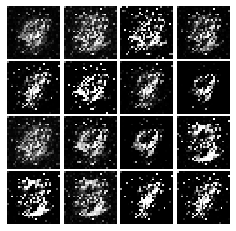

Epoch: 1, Iter: 920, D: 1.656, G:1.052


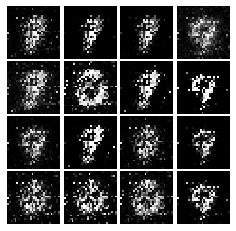

Epoch: 2, Iter: 940, D: 1.196, G:1.082


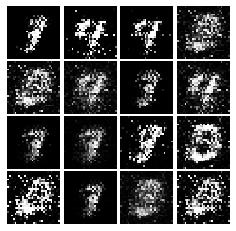

Epoch: 2, Iter: 960, D: 1.277, G:1.177


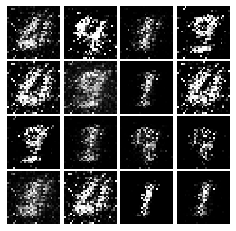

Epoch: 2, Iter: 980, D: 1.496, G:0.1567


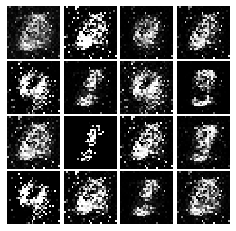

Epoch: 2, Iter: 1000, D: 1.029, G:1.862


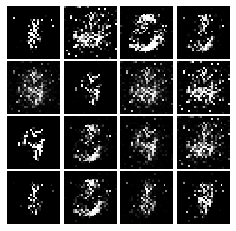

Epoch: 2, Iter: 1020, D: 1.019, G:1.487


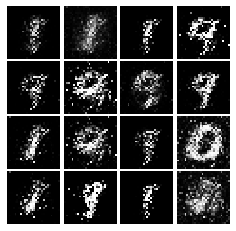

Epoch: 2, Iter: 1040, D: 1.04, G:1.336


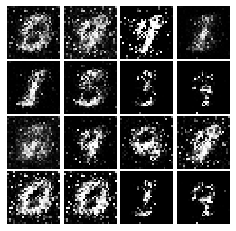

Epoch: 2, Iter: 1060, D: 1.174, G:1.2


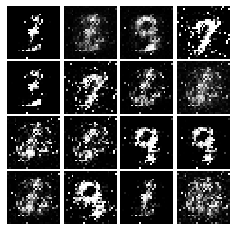

Epoch: 2, Iter: 1080, D: 1.068, G:1.166


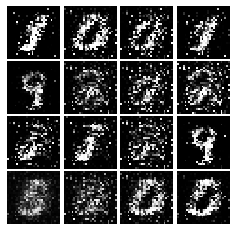

Epoch: 2, Iter: 1100, D: 1.123, G:1.476


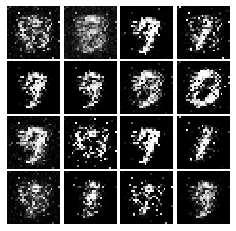

Epoch: 2, Iter: 1120, D: 1.218, G:1.037


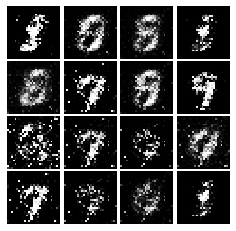

Epoch: 2, Iter: 1140, D: 1.8, G:2.022


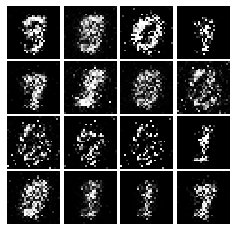

Epoch: 2, Iter: 1160, D: 1.171, G:1.03


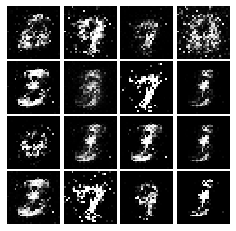

Epoch: 2, Iter: 1180, D: 1.351, G:1.233


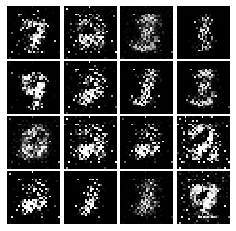

Epoch: 2, Iter: 1200, D: 1.281, G:1.394


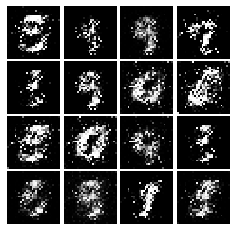

Epoch: 2, Iter: 1220, D: 1.826, G:0.5585


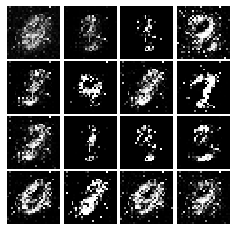

Epoch: 2, Iter: 1240, D: 1.206, G:1.059


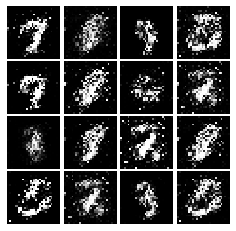

Epoch: 2, Iter: 1260, D: 1.089, G:1.299


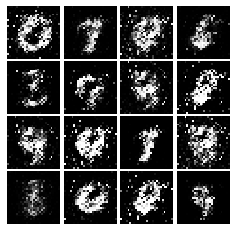

Epoch: 2, Iter: 1280, D: 1.359, G:0.8229


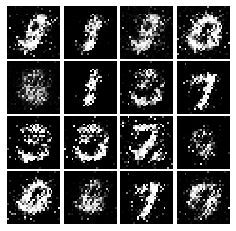

Epoch: 2, Iter: 1300, D: 1.255, G:1.13


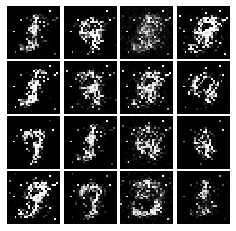

Epoch: 2, Iter: 1320, D: 1.537, G:2.924


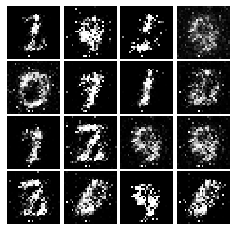

Epoch: 2, Iter: 1340, D: 1.329, G:1.776


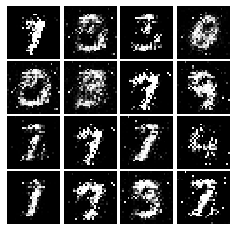

Epoch: 2, Iter: 1360, D: 2.515, G:0.9649


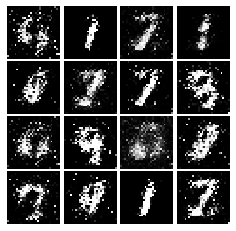

Epoch: 2, Iter: 1380, D: 1.196, G:1.272


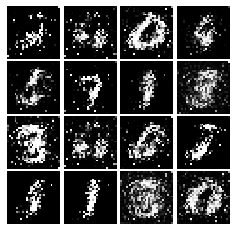

Epoch: 2, Iter: 1400, D: 1.322, G:1.461


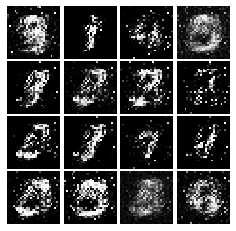

Epoch: 3, Iter: 1420, D: 1.215, G:0.8768


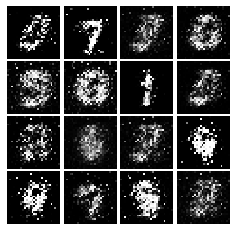

Epoch: 3, Iter: 1440, D: 1.255, G:1.244


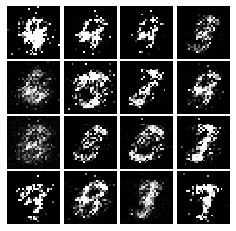

Epoch: 3, Iter: 1460, D: 1.262, G:0.9839


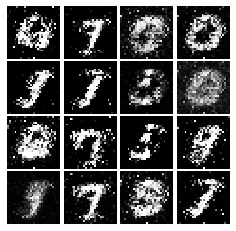

Epoch: 3, Iter: 1480, D: 1.271, G:1.026


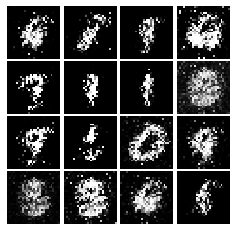

Epoch: 3, Iter: 1500, D: 1.223, G:0.979


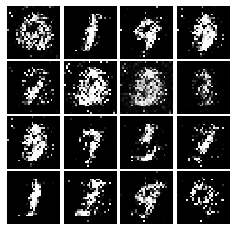

Epoch: 3, Iter: 1520, D: 1.096, G:2.085


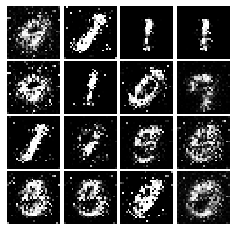

Epoch: 3, Iter: 1540, D: 1.406, G:0.8336


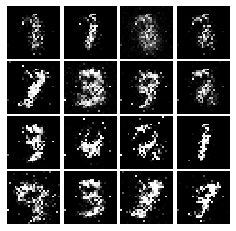

Epoch: 3, Iter: 1560, D: 1.048, G:1.589


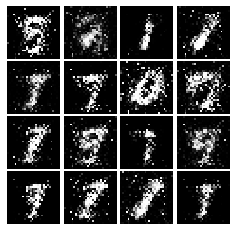

Epoch: 3, Iter: 1580, D: 1.257, G:0.9267


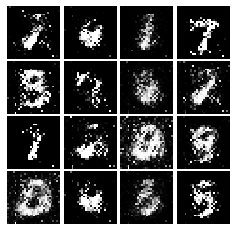

Epoch: 3, Iter: 1600, D: 1.128, G:0.7373


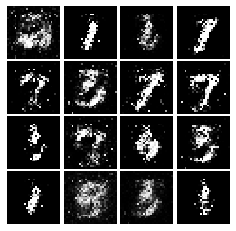

Epoch: 3, Iter: 1620, D: 1.096, G:1.092


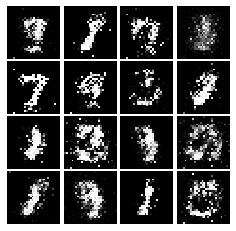

Epoch: 3, Iter: 1640, D: 1.254, G:0.9892


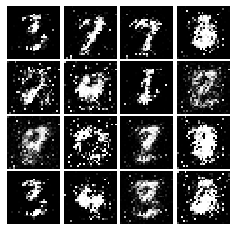

Epoch: 3, Iter: 1660, D: 1.127, G:0.9625


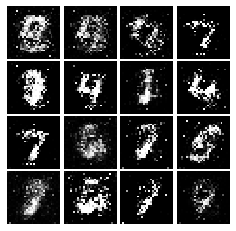

Epoch: 3, Iter: 1680, D: 1.206, G:0.9424


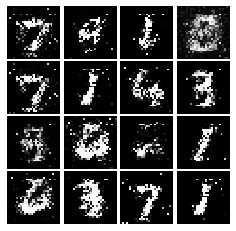

Epoch: 3, Iter: 1700, D: 1.324, G:1.125


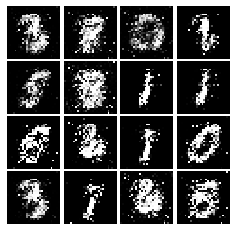

Epoch: 3, Iter: 1720, D: 1.219, G:0.832


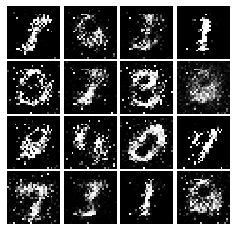

Epoch: 3, Iter: 1740, D: 1.032, G:0.9321


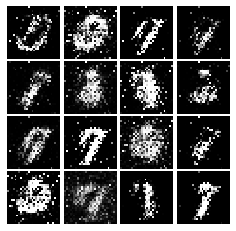

Epoch: 3, Iter: 1760, D: 1.089, G:1.131


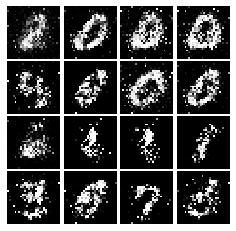

Epoch: 3, Iter: 1780, D: 1.237, G:0.96


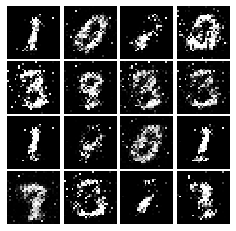

Epoch: 3, Iter: 1800, D: 1.356, G:0.8216


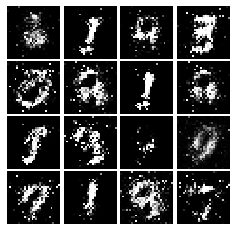

Epoch: 3, Iter: 1820, D: 1.399, G:1.077


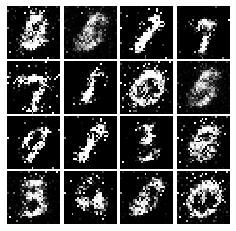

Epoch: 3, Iter: 1840, D: 1.521, G:0.9029


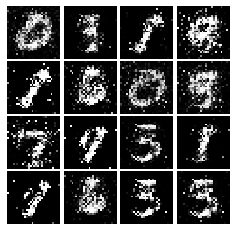

Epoch: 3, Iter: 1860, D: 1.363, G:0.7926


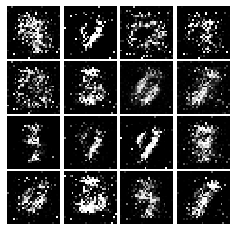

Epoch: 4, Iter: 1880, D: 1.309, G:0.8649


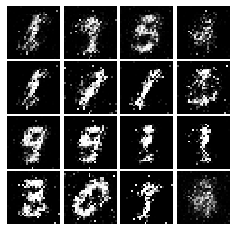

Epoch: 4, Iter: 1900, D: 1.284, G:0.9737


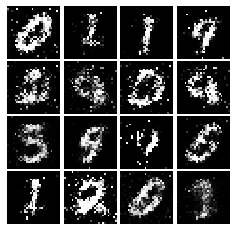

Epoch: 4, Iter: 1920, D: 1.343, G:0.8016


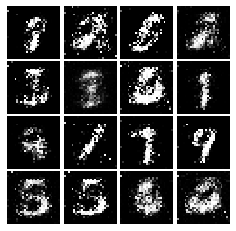

Epoch: 4, Iter: 1940, D: 1.245, G:0.9072


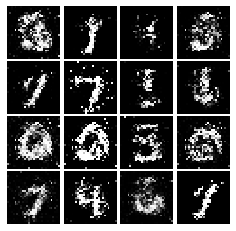

Epoch: 4, Iter: 1960, D: 1.32, G:0.8424


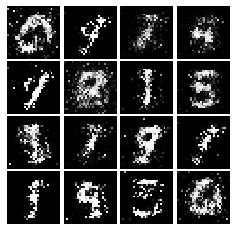

Epoch: 4, Iter: 1980, D: 1.188, G:0.8534


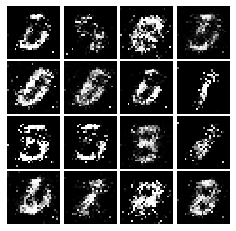

Epoch: 4, Iter: 2000, D: 1.278, G:0.7955


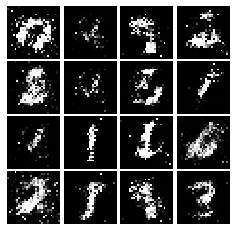

Epoch: 4, Iter: 2020, D: 1.298, G:0.8307


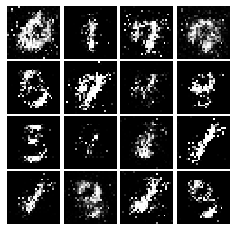

Epoch: 4, Iter: 2040, D: 1.331, G:0.8107


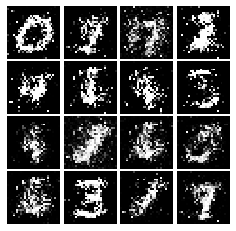

Epoch: 4, Iter: 2060, D: 1.244, G:0.9408


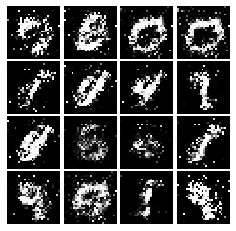

Epoch: 4, Iter: 2080, D: 1.361, G:0.5672


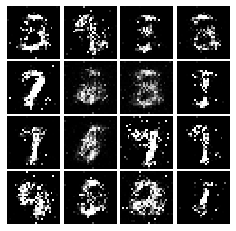

Epoch: 4, Iter: 2100, D: 1.348, G:0.9771


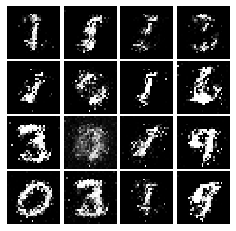

Epoch: 4, Iter: 2120, D: 1.285, G:0.8715


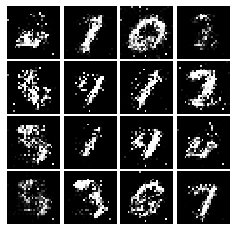

Epoch: 4, Iter: 2140, D: 1.501, G:0.8966


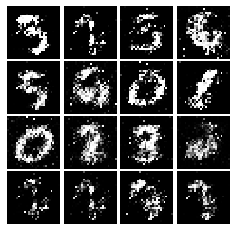

Epoch: 4, Iter: 2160, D: 1.319, G:0.9126


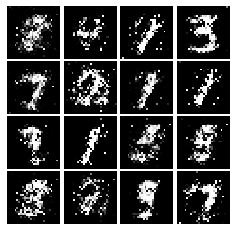

Epoch: 4, Iter: 2180, D: 1.362, G:0.5117


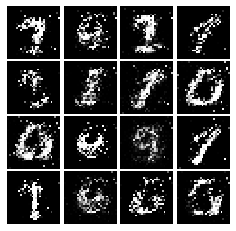

Epoch: 4, Iter: 2200, D: 1.202, G:0.7125


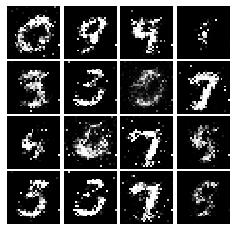

Epoch: 4, Iter: 2220, D: 1.363, G:0.7412


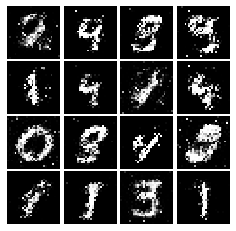

Epoch: 4, Iter: 2240, D: 1.27, G:0.8332


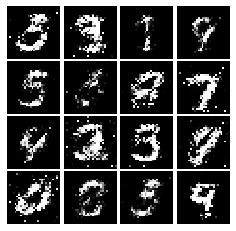

Epoch: 4, Iter: 2260, D: 1.283, G:1.115


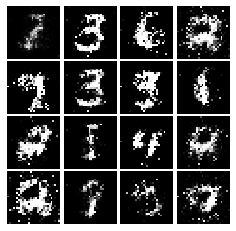

Epoch: 4, Iter: 2280, D: 1.246, G:0.9871


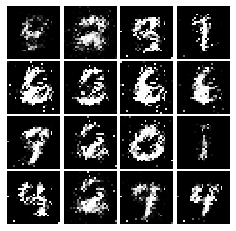

Epoch: 4, Iter: 2300, D: 1.361, G:0.8836


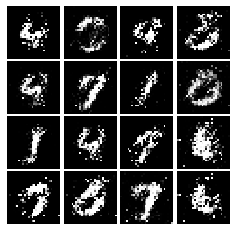

Epoch: 4, Iter: 2320, D: 1.266, G:0.9728


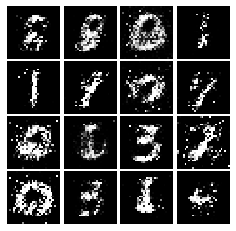

Epoch: 4, Iter: 2340, D: 1.247, G:0.9544


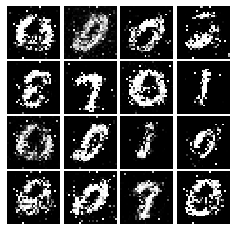

Epoch: 5, Iter: 2360, D: 1.154, G:1.357


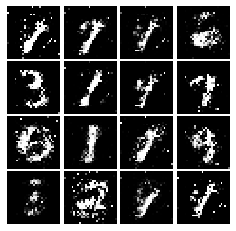

Epoch: 5, Iter: 2380, D: 1.208, G:0.8784


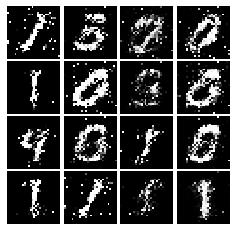

Epoch: 5, Iter: 2400, D: 1.278, G:0.987


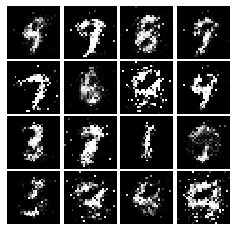

Epoch: 5, Iter: 2420, D: 1.342, G:0.9407


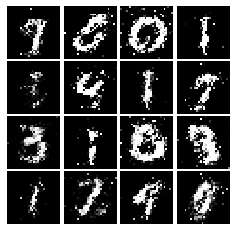

Epoch: 5, Iter: 2440, D: 1.323, G:0.7742


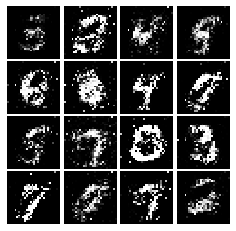

Epoch: 5, Iter: 2460, D: 1.205, G:0.9928


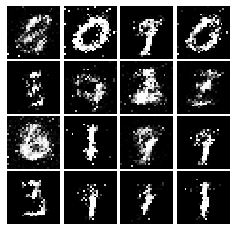

Epoch: 5, Iter: 2480, D: 1.236, G:0.9124


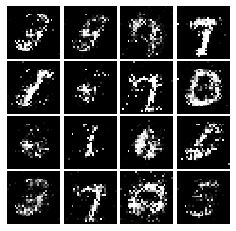

Epoch: 5, Iter: 2500, D: 1.235, G:0.993


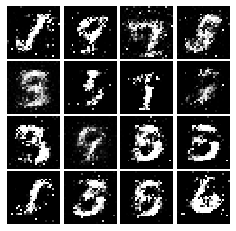

Epoch: 5, Iter: 2520, D: 1.42, G:0.7432


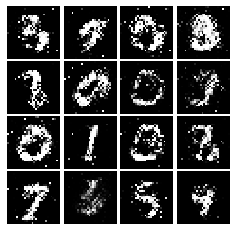

Epoch: 5, Iter: 2540, D: 1.254, G:0.9278


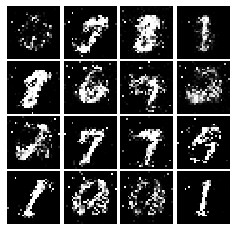

Epoch: 5, Iter: 2560, D: 1.277, G:0.8547


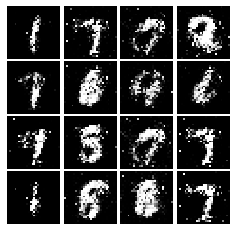

Epoch: 5, Iter: 2580, D: 1.289, G:1.028


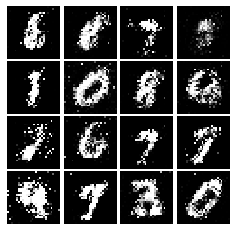

Epoch: 5, Iter: 2600, D: 1.418, G:0.7669


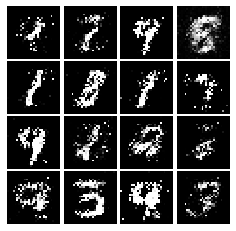

Epoch: 5, Iter: 2620, D: 1.351, G:0.8723


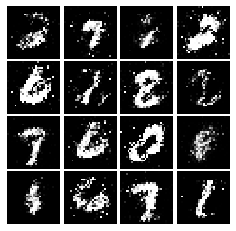

Epoch: 5, Iter: 2640, D: 1.32, G:0.8931


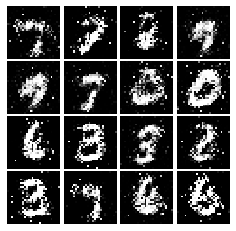

Epoch: 5, Iter: 2660, D: 1.274, G:0.8327


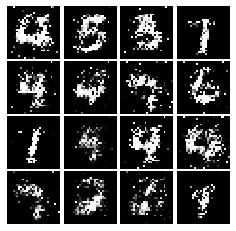

Epoch: 5, Iter: 2680, D: 1.473, G:0.8623


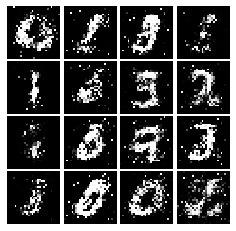

Epoch: 5, Iter: 2700, D: 1.396, G:0.9177


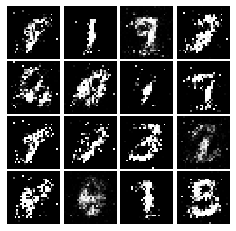

Epoch: 5, Iter: 2720, D: 1.307, G:0.8562


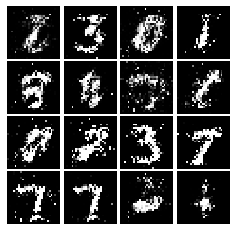

Epoch: 5, Iter: 2740, D: 1.337, G:0.756


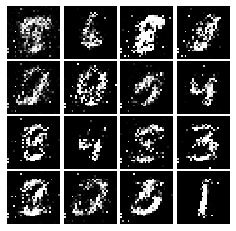

Epoch: 5, Iter: 2760, D: 1.371, G:0.8101


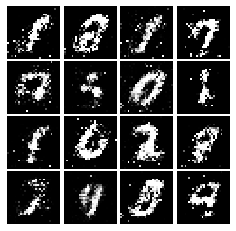

Epoch: 5, Iter: 2780, D: 1.302, G:0.876


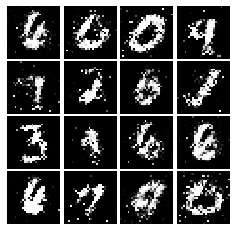

Epoch: 5, Iter: 2800, D: 1.242, G:0.8986


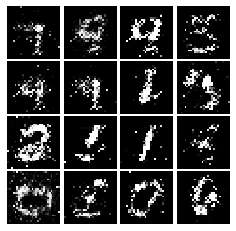

Epoch: 6, Iter: 2820, D: 1.3, G:1.261


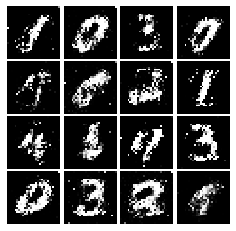

Epoch: 6, Iter: 2840, D: 1.395, G:0.4462


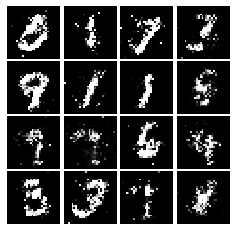

Epoch: 6, Iter: 2860, D: 1.306, G:0.9627


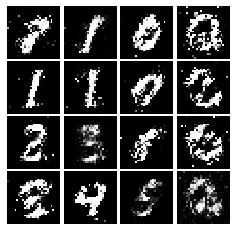

Epoch: 6, Iter: 2880, D: 1.323, G:0.8994


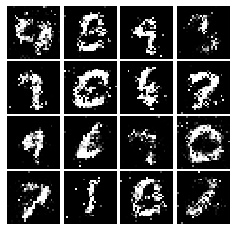

Epoch: 6, Iter: 2900, D: 1.257, G:0.845


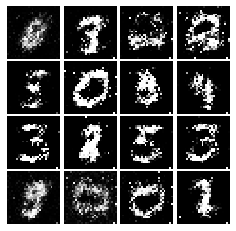

Epoch: 6, Iter: 2920, D: 1.315, G:0.8879


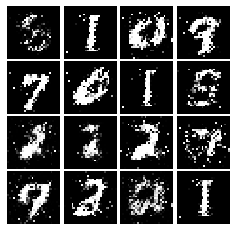

Epoch: 6, Iter: 2940, D: 1.277, G:1.16


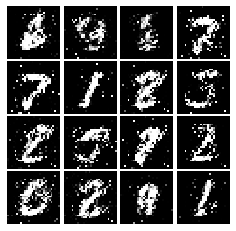

Epoch: 6, Iter: 2960, D: 1.238, G:0.9247


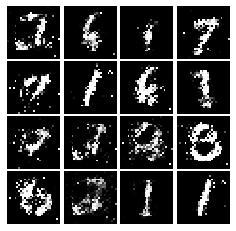

Epoch: 6, Iter: 2980, D: 1.301, G:0.8201


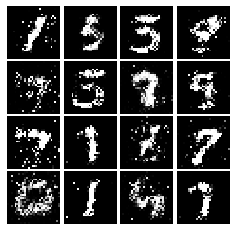

Epoch: 6, Iter: 3000, D: 1.305, G:0.8598


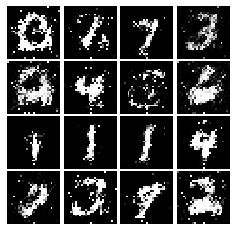

Epoch: 6, Iter: 3020, D: 1.267, G:0.9442


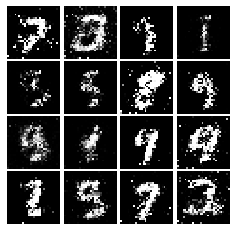

Epoch: 6, Iter: 3040, D: 1.348, G:0.8401


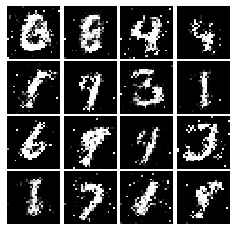

Epoch: 6, Iter: 3060, D: 1.323, G:0.8609


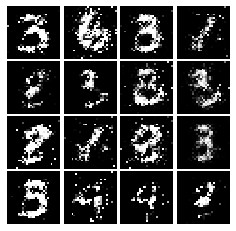

Epoch: 6, Iter: 3080, D: 1.312, G:0.8094


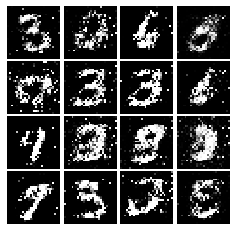

Epoch: 6, Iter: 3100, D: 1.265, G:0.9247


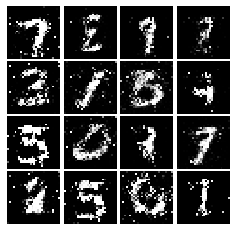

Epoch: 6, Iter: 3120, D: 1.682, G:0.515


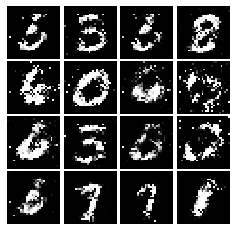

Epoch: 6, Iter: 3140, D: 1.367, G:0.8277


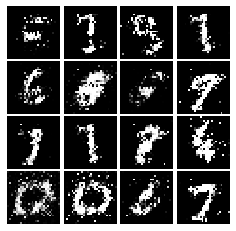

Epoch: 6, Iter: 3160, D: 1.362, G:0.7536


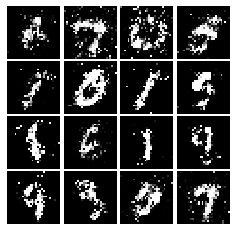

Epoch: 6, Iter: 3180, D: 1.25, G:0.9102


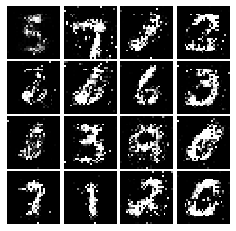

Epoch: 6, Iter: 3200, D: 1.259, G:0.9735


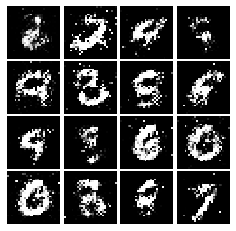

Epoch: 6, Iter: 3220, D: 1.341, G:0.85


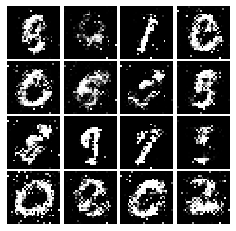

Epoch: 6, Iter: 3240, D: 1.33, G:0.8783


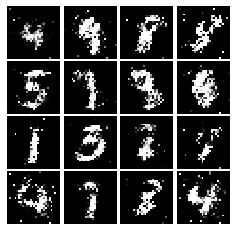

Epoch: 6, Iter: 3260, D: 1.415, G:0.7564


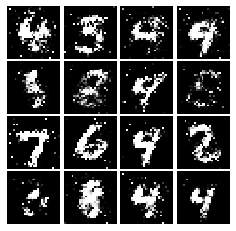

Epoch: 6, Iter: 3280, D: 1.364, G:0.9984


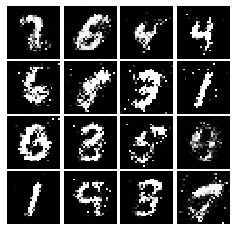

Epoch: 7, Iter: 3300, D: 1.236, G:0.7746


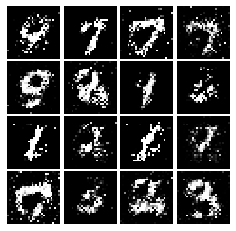

Epoch: 7, Iter: 3320, D: 1.285, G:0.8773


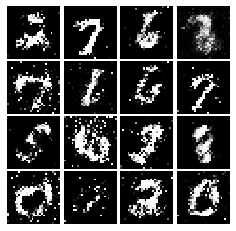

Epoch: 7, Iter: 3340, D: 1.381, G:0.907


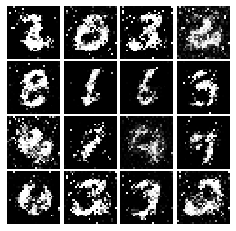

Epoch: 7, Iter: 3360, D: 1.448, G:0.8862


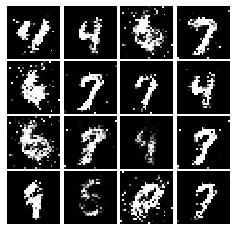

Epoch: 7, Iter: 3380, D: 1.289, G:0.8801


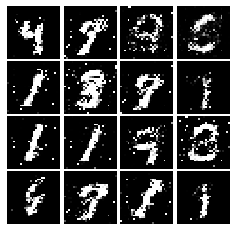

Epoch: 7, Iter: 3400, D: 1.345, G:0.8637


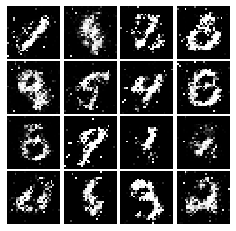

Epoch: 7, Iter: 3420, D: 1.266, G:0.839


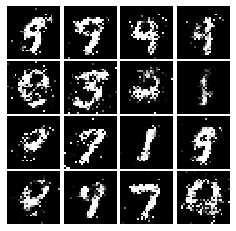

Epoch: 7, Iter: 3440, D: 1.339, G:0.8267


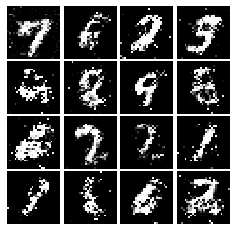

Epoch: 7, Iter: 3460, D: 1.373, G:0.7347


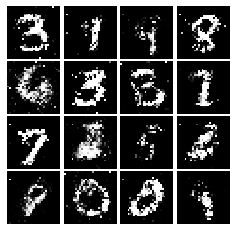

Epoch: 7, Iter: 3480, D: 1.34, G:0.793


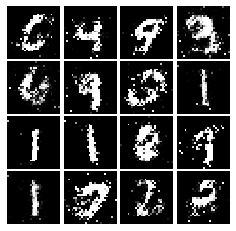

Epoch: 7, Iter: 3500, D: 1.292, G:0.7433


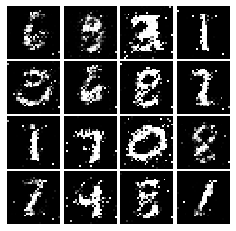

Epoch: 7, Iter: 3520, D: 1.314, G:0.832


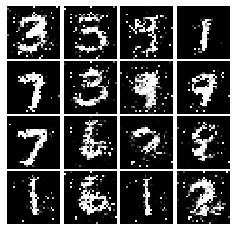

Epoch: 7, Iter: 3540, D: 1.296, G:0.7554


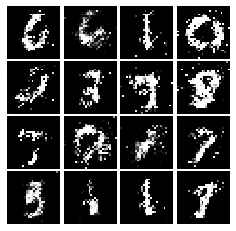

Epoch: 7, Iter: 3560, D: 1.29, G:0.8429


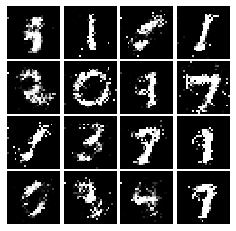

Epoch: 7, Iter: 3580, D: 1.317, G:0.8358


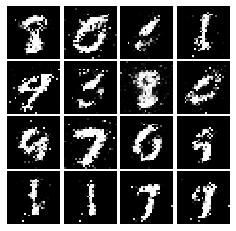

Epoch: 7, Iter: 3600, D: 1.356, G:0.7352


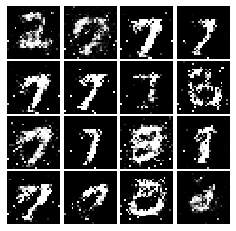

Epoch: 7, Iter: 3620, D: 1.254, G:2.103


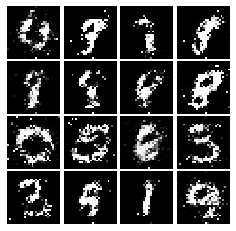

Epoch: 7, Iter: 3640, D: 1.301, G:0.8147


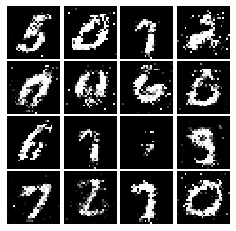

Epoch: 7, Iter: 3660, D: 1.357, G:0.783


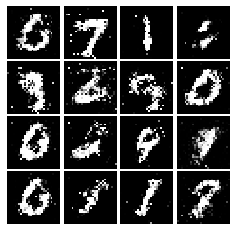

Epoch: 7, Iter: 3680, D: 1.361, G:0.7919


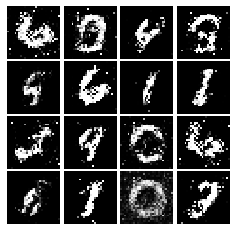

Epoch: 7, Iter: 3700, D: 1.322, G:0.8033


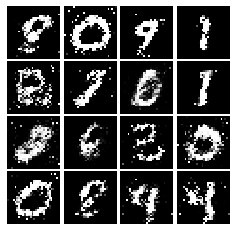

Epoch: 7, Iter: 3720, D: 1.276, G:0.7803


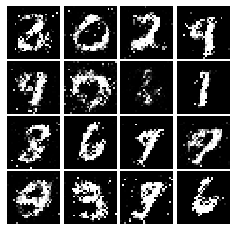

Epoch: 7, Iter: 3740, D: 1.33, G:0.7282


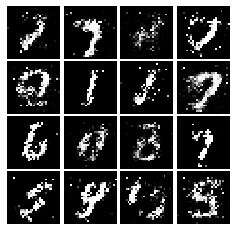

Epoch: 8, Iter: 3760, D: 1.364, G:0.7833


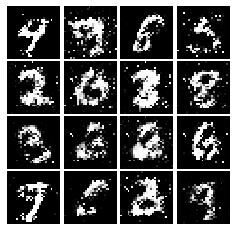

Epoch: 8, Iter: 3780, D: 1.352, G:0.8929


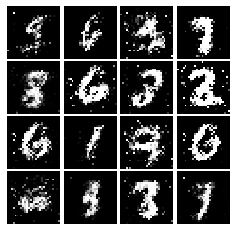

Epoch: 8, Iter: 3800, D: 1.457, G:0.7226


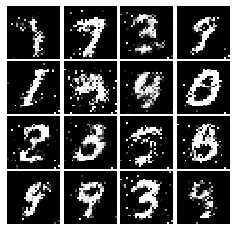

Epoch: 8, Iter: 3820, D: 1.348, G:0.7637


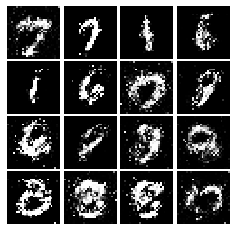

Epoch: 8, Iter: 3840, D: 1.373, G:0.9177


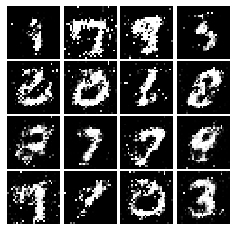

Epoch: 8, Iter: 3860, D: 1.339, G:0.7904


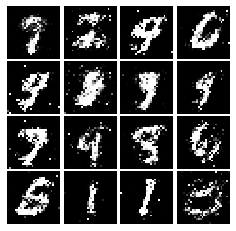

Epoch: 8, Iter: 3880, D: 1.212, G:0.848


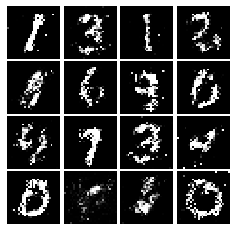

Epoch: 8, Iter: 3900, D: 1.369, G:0.7317


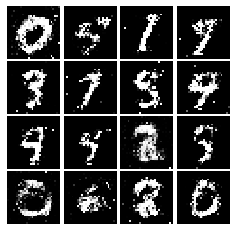

Epoch: 8, Iter: 3920, D: 1.352, G:0.921


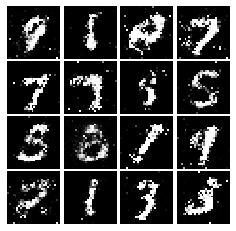

Epoch: 8, Iter: 3940, D: 1.404, G:0.7727


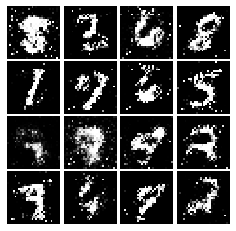

Epoch: 8, Iter: 3960, D: 1.328, G:0.7821


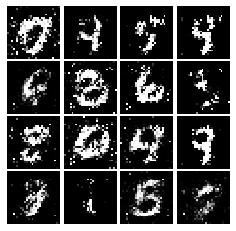

Epoch: 8, Iter: 3980, D: 1.362, G:0.8027


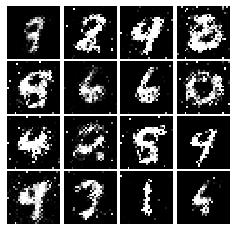

Epoch: 8, Iter: 4000, D: 1.318, G:0.7993


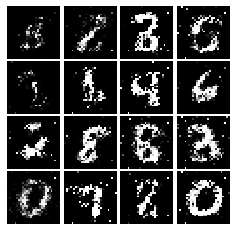

Epoch: 8, Iter: 4020, D: 1.377, G:0.8007


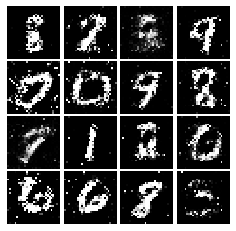

Epoch: 8, Iter: 4040, D: 1.301, G:0.8724


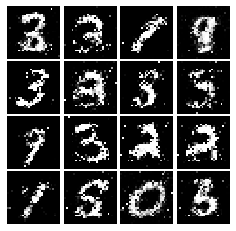

Epoch: 8, Iter: 4060, D: 1.284, G:0.7716


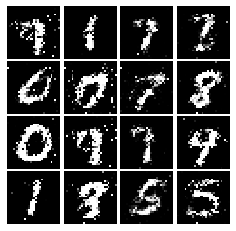

Epoch: 8, Iter: 4080, D: 1.42, G:0.8304


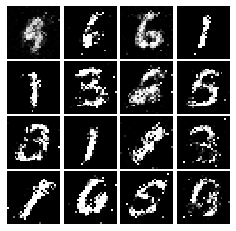

Epoch: 8, Iter: 4100, D: 1.374, G:0.7842


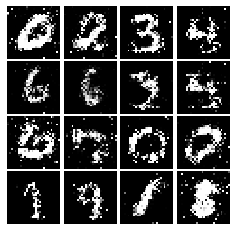

Epoch: 8, Iter: 4120, D: 1.337, G:0.8901


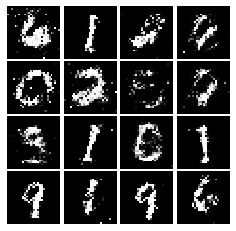

Epoch: 8, Iter: 4140, D: 1.359, G:0.8134


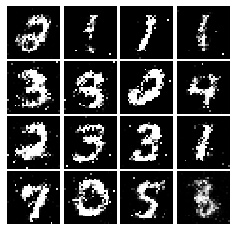

Epoch: 8, Iter: 4160, D: 1.353, G:0.9628


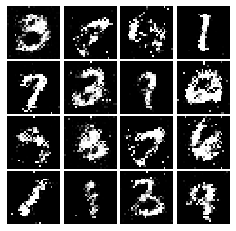

Epoch: 8, Iter: 4180, D: 1.38, G:0.775


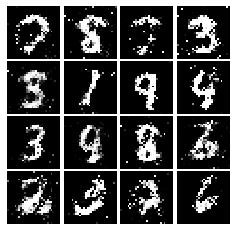

Epoch: 8, Iter: 4200, D: 1.315, G:0.8019


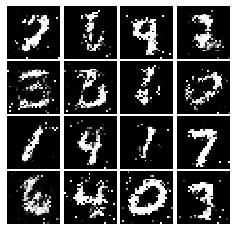

Epoch: 8, Iter: 4220, D: 1.428, G:0.7569


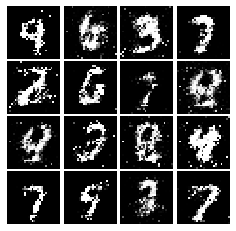

Epoch: 9, Iter: 4240, D: 1.358, G:0.7019


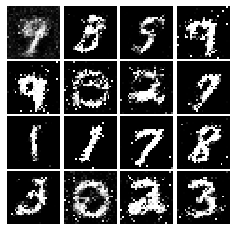

Epoch: 9, Iter: 4260, D: 1.38, G:0.7381


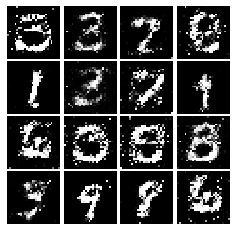

Epoch: 9, Iter: 4280, D: 1.351, G:0.8727


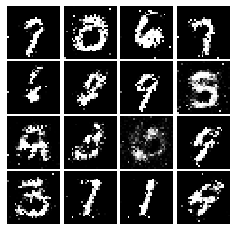

Epoch: 9, Iter: 4300, D: 1.442, G:0.7605


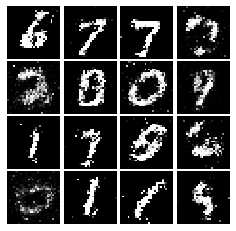

Epoch: 9, Iter: 4320, D: 1.348, G:0.8325


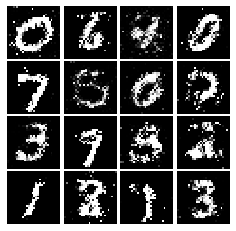

Epoch: 9, Iter: 4340, D: 1.414, G:0.894


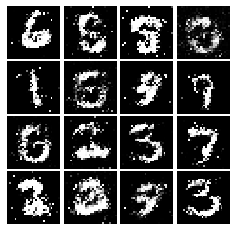

Epoch: 9, Iter: 4360, D: 1.337, G:0.7263


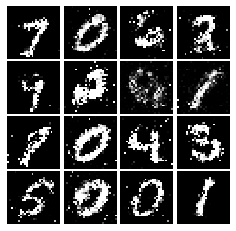

Epoch: 9, Iter: 4380, D: 1.393, G:0.8419


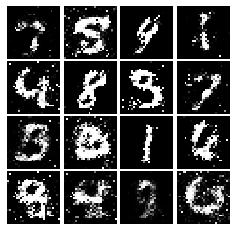

Epoch: 9, Iter: 4400, D: 1.261, G:0.7982


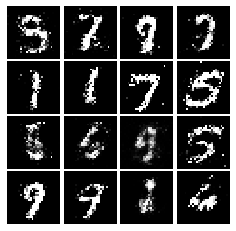

Epoch: 9, Iter: 4420, D: 1.312, G:0.7632


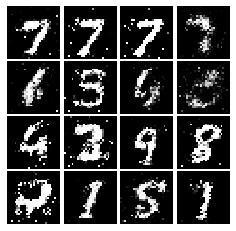

Epoch: 9, Iter: 4440, D: 1.282, G:0.77


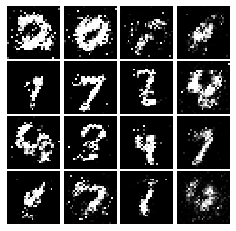

Epoch: 9, Iter: 4460, D: 1.361, G:0.7645


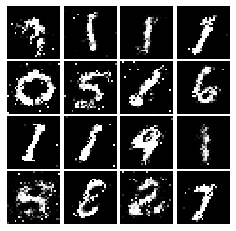

Epoch: 9, Iter: 4480, D: 1.36, G:0.7402


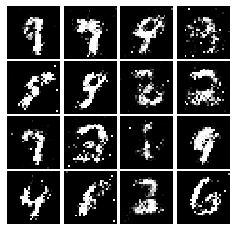

Epoch: 9, Iter: 4500, D: 1.401, G:0.8068


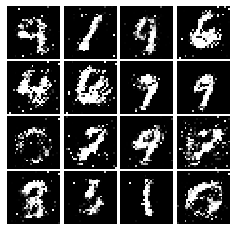

Epoch: 9, Iter: 4520, D: 1.294, G:0.799


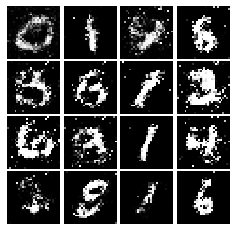

Epoch: 9, Iter: 4540, D: 1.365, G:0.6566


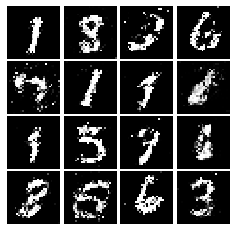

Epoch: 9, Iter: 4560, D: 1.233, G:0.8457


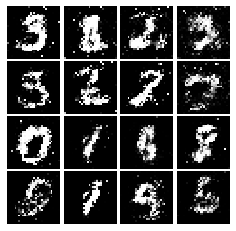

Epoch: 9, Iter: 4580, D: 1.395, G:0.7421


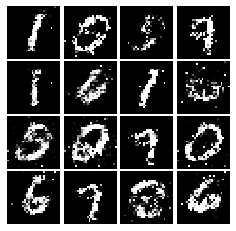

Epoch: 9, Iter: 4600, D: 1.385, G:0.8155


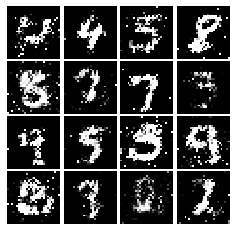

Epoch: 9, Iter: 4620, D: 1.31, G:0.7379


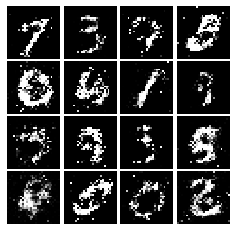

Epoch: 9, Iter: 4640, D: 1.318, G:0.8445


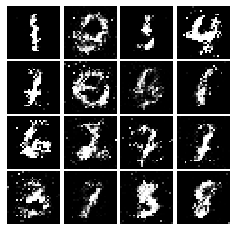

Epoch: 9, Iter: 4660, D: 1.342, G:0.7792


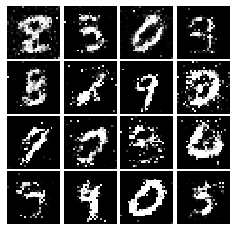

Epoch: 9, Iter: 4680, D: 1.362, G:0.7672


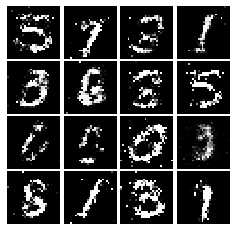

Final images


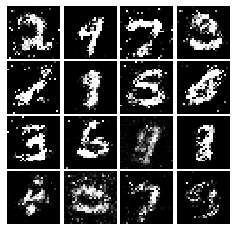

In [18]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [19]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * (tf.reduce_mean(tf.square(scores_real - 1)) + tf.reduce_mean(tf.square(scores_fake)))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    #bce = tf.keras.losses.BinaryCrossentropy()
    #loss = bce(tf.ones_like(logits_fake), logits_fake)
    loss = 0.5 * tf.reduce_mean(tf.square(scores_fake - 1))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [20]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.2092, G:0.3857


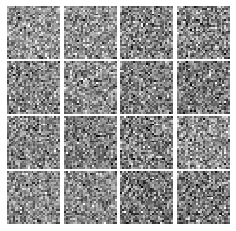

Epoch: 0, Iter: 20, D: 0.1283, G:2.366


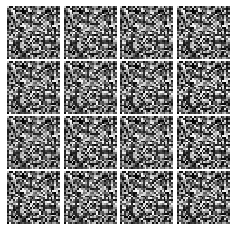

Epoch: 0, Iter: 40, D: 0.1596, G:0.4023


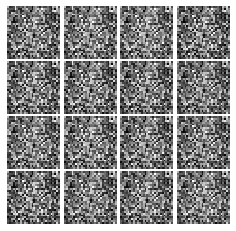

Epoch: 0, Iter: 60, D: 0.06726, G:0.6707


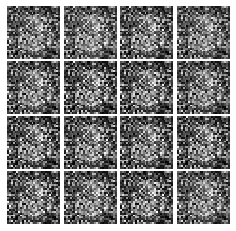

Epoch: 0, Iter: 80, D: 0.2106, G:0.6184


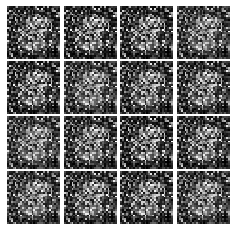

Epoch: 0, Iter: 100, D: 0.06629, G:0.8923


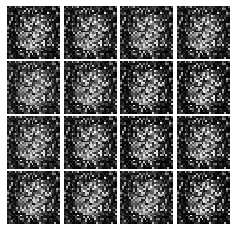

Epoch: 0, Iter: 120, D: 0.03956, G:0.6309


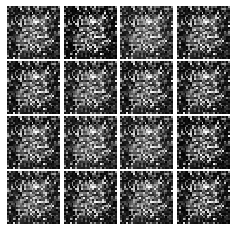

Epoch: 0, Iter: 140, D: 0.08493, G:0.6192


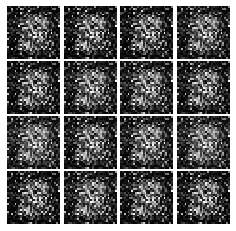

Epoch: 0, Iter: 160, D: 0.1204, G:0.1516


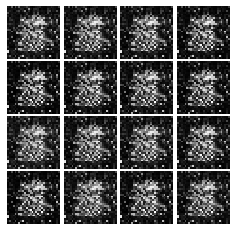

Epoch: 0, Iter: 180, D: 0.1162, G:0.5986


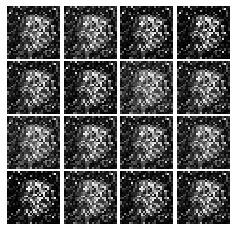

Epoch: 0, Iter: 200, D: 0.0533, G:0.7678


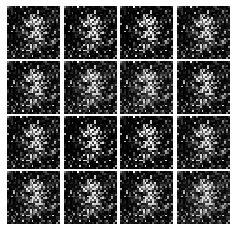

Epoch: 0, Iter: 220, D: 0.2464, G:1.174


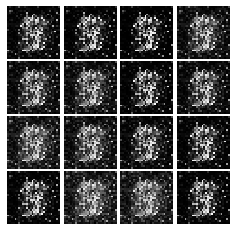

Epoch: 0, Iter: 240, D: 0.1044, G:0.4984


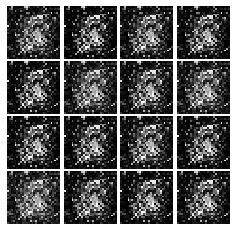

Epoch: 0, Iter: 260, D: 0.1436, G:0.3189


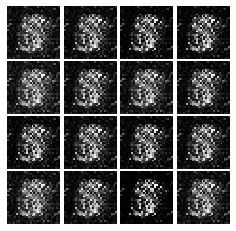

Epoch: 0, Iter: 280, D: 0.1194, G:0.3156


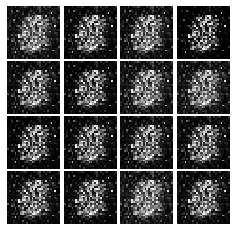

Epoch: 0, Iter: 300, D: 0.1069, G:0.5333


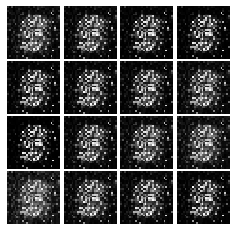

Epoch: 0, Iter: 320, D: 0.5459, G:0.7195


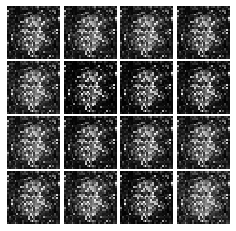

Epoch: 0, Iter: 340, D: 0.1861, G:0.3328


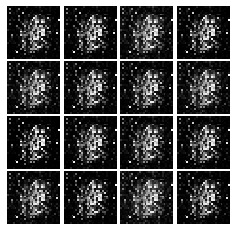

Epoch: 0, Iter: 360, D: 0.1356, G:0.4735


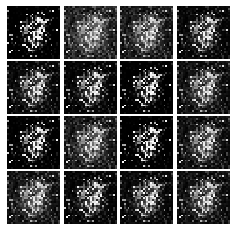

Epoch: 0, Iter: 380, D: 0.1093, G:0.4328


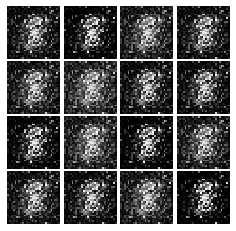

Epoch: 0, Iter: 400, D: 0.1176, G:0.4623


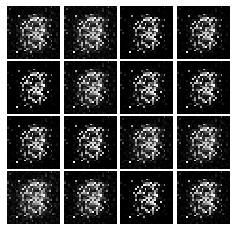

Epoch: 0, Iter: 420, D: 0.08316, G:0.7921


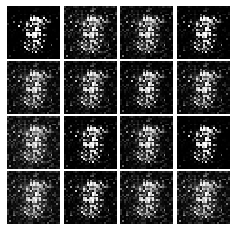

Epoch: 0, Iter: 440, D: 0.2012, G:0.3479


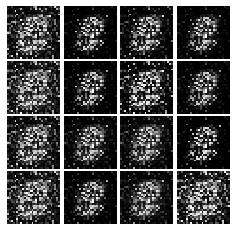

Epoch: 0, Iter: 460, D: 0.1434, G:0.3193


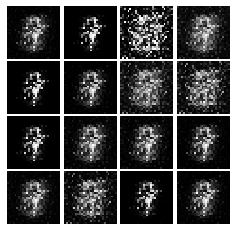

Epoch: 1, Iter: 480, D: 0.1148, G:0.3089


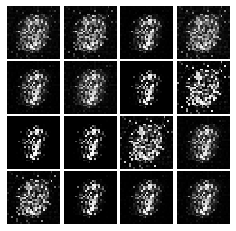

Epoch: 1, Iter: 500, D: 0.178, G:0.4557


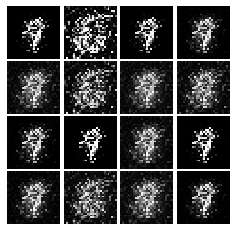

Epoch: 1, Iter: 520, D: 0.1293, G:0.3234


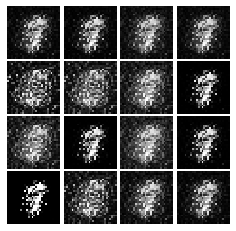

Epoch: 1, Iter: 540, D: 0.1355, G:0.3025


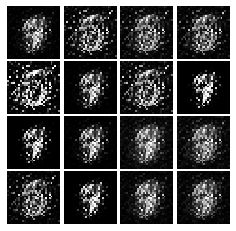

Epoch: 1, Iter: 560, D: 0.1073, G:0.4101


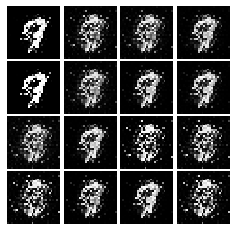

Epoch: 1, Iter: 580, D: 0.1752, G:0.6037


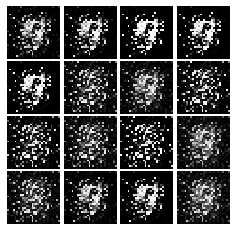

Epoch: 1, Iter: 600, D: 0.1248, G:0.4864


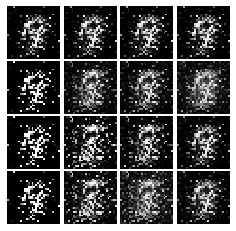

Epoch: 1, Iter: 620, D: 0.175, G:0.6221


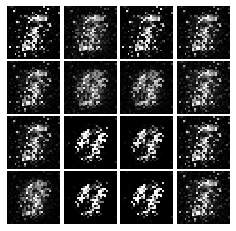

Epoch: 1, Iter: 640, D: 0.1222, G:0.3671


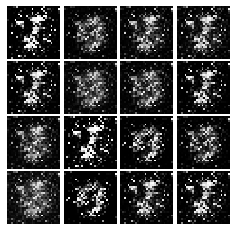

Epoch: 1, Iter: 660, D: 0.2359, G:0.2184


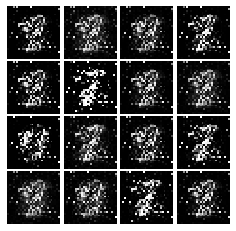

Epoch: 1, Iter: 680, D: 0.3224, G:0.01024


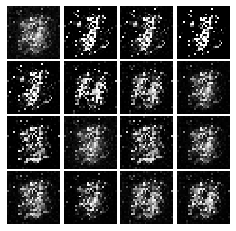

Epoch: 1, Iter: 700, D: 0.1488, G:0.2618


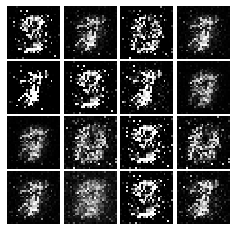

Epoch: 1, Iter: 720, D: 0.2044, G:0.3014


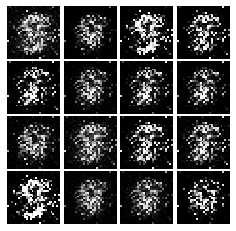

Epoch: 1, Iter: 740, D: 0.1756, G:0.2368


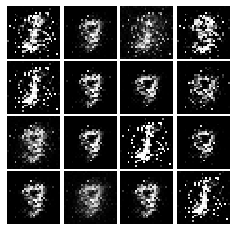

Epoch: 1, Iter: 760, D: 0.1607, G:0.275


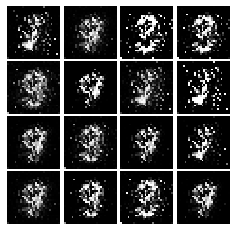

Epoch: 1, Iter: 780, D: 0.1096, G:0.5


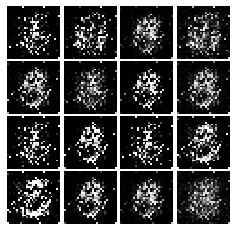

Epoch: 1, Iter: 800, D: 0.1345, G:0.2952


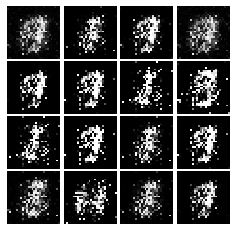

Epoch: 1, Iter: 820, D: 0.1382, G:0.5803


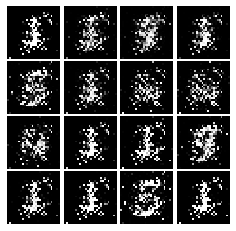

Epoch: 1, Iter: 840, D: 0.07812, G:0.4016


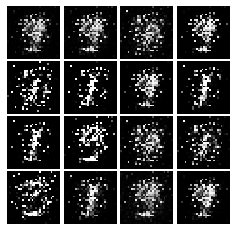

Epoch: 1, Iter: 860, D: 0.2272, G:0.1987


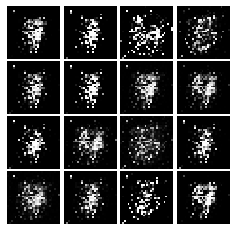

Epoch: 1, Iter: 880, D: 0.1524, G:0.4726


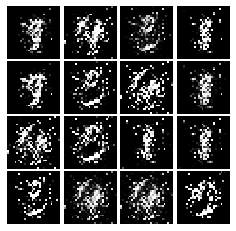

Epoch: 1, Iter: 900, D: 0.1168, G:0.4777


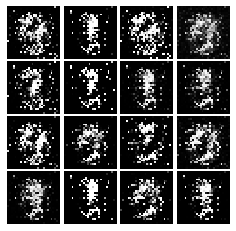

Epoch: 1, Iter: 920, D: 0.1595, G:0.2257


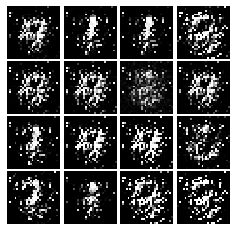

Epoch: 2, Iter: 940, D: 0.2281, G:0.5913


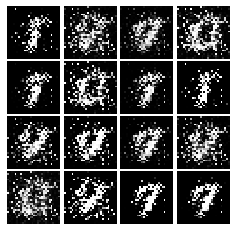

Epoch: 2, Iter: 960, D: 0.1476, G:0.2548


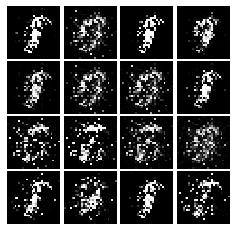

Epoch: 2, Iter: 980, D: 0.07507, G:0.5214


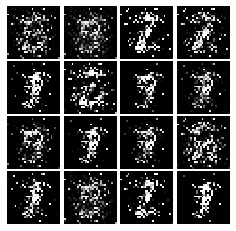

Epoch: 2, Iter: 1000, D: 0.1529, G:0.2729


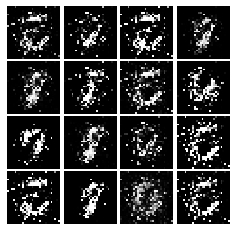

Epoch: 2, Iter: 1020, D: 0.08307, G:0.5391


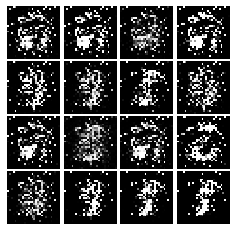

Epoch: 2, Iter: 1040, D: 0.1058, G:1.574


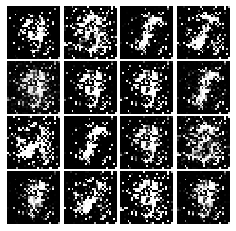

Epoch: 2, Iter: 1060, D: 0.3538, G:0.3373


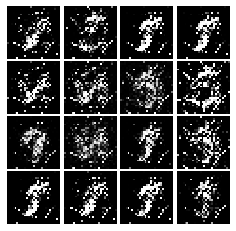

Epoch: 2, Iter: 1080, D: 0.09882, G:2.444


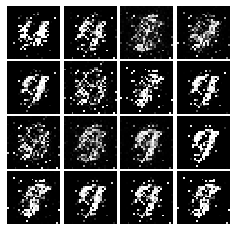

Epoch: 2, Iter: 1100, D: 0.1866, G:0.1838


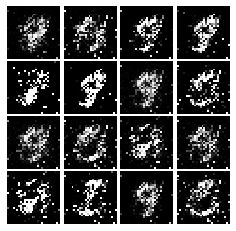

Epoch: 2, Iter: 1120, D: 0.1523, G:0.3706


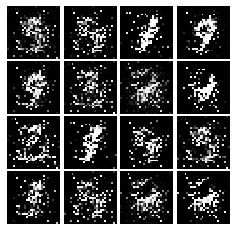

Epoch: 2, Iter: 1140, D: 0.1127, G:0.3062


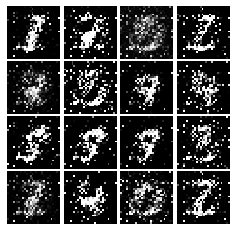

Epoch: 2, Iter: 1160, D: 0.1144, G:0.3656


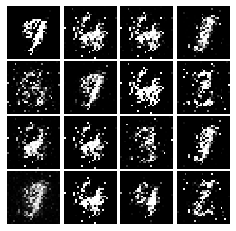

Epoch: 2, Iter: 1180, D: 0.1917, G:0.1883


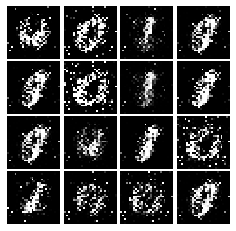

Epoch: 2, Iter: 1200, D: 0.1525, G:0.2803


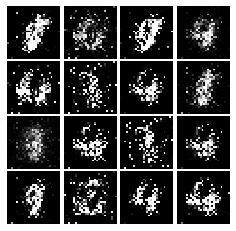

Epoch: 2, Iter: 1220, D: 0.1878, G:0.211


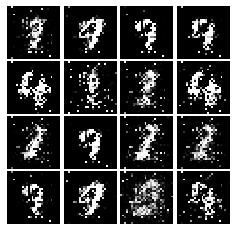

Epoch: 2, Iter: 1240, D: 0.1539, G:0.2288


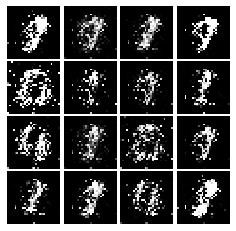

Epoch: 2, Iter: 1260, D: 0.1576, G:0.2598


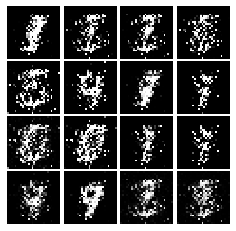

Epoch: 2, Iter: 1280, D: 0.1673, G:0.2225


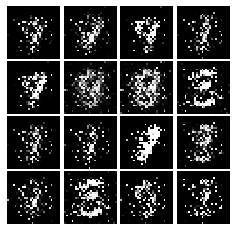

Epoch: 2, Iter: 1300, D: 0.1459, G:0.3471


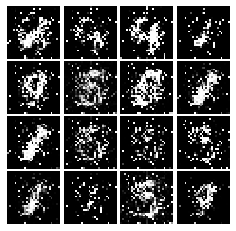

Epoch: 2, Iter: 1320, D: 0.2634, G:0.2341


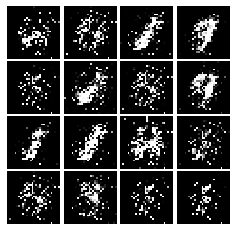

Epoch: 2, Iter: 1340, D: 0.1597, G:0.2603


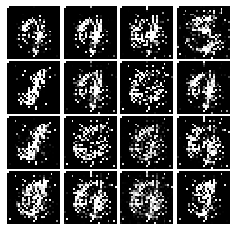

Epoch: 2, Iter: 1360, D: 0.772, G:0.2114


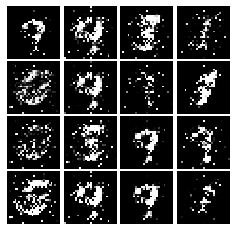

Epoch: 2, Iter: 1380, D: 0.1393, G:0.2667


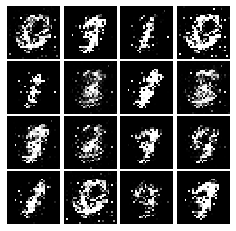

Epoch: 2, Iter: 1400, D: 0.1078, G:1.225


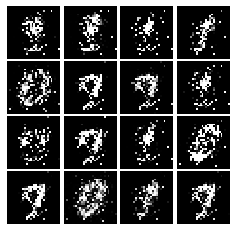

Epoch: 3, Iter: 1420, D: 0.1167, G:0.2532


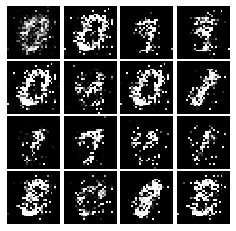

Epoch: 3, Iter: 1440, D: 0.1561, G:0.2744


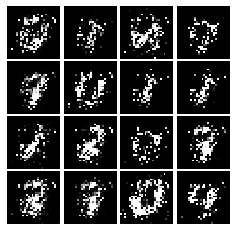

Epoch: 3, Iter: 1460, D: 0.1547, G:0.33


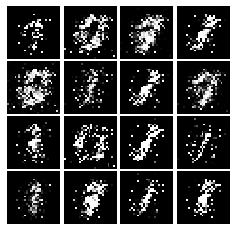

Epoch: 3, Iter: 1480, D: 0.2347, G:0.2077


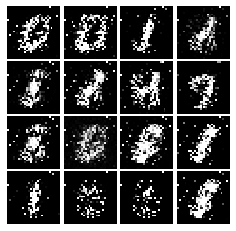

Epoch: 3, Iter: 1500, D: 0.1123, G:0.5296


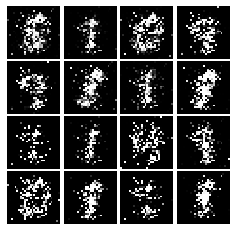

Epoch: 3, Iter: 1520, D: 0.1712, G:0.2843


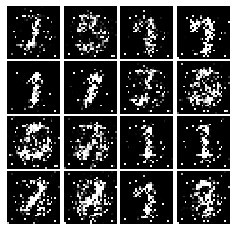

Epoch: 3, Iter: 1540, D: 0.1073, G:0.3875


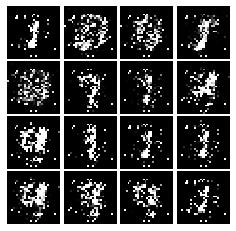

Epoch: 3, Iter: 1560, D: 0.1477, G:0.3675


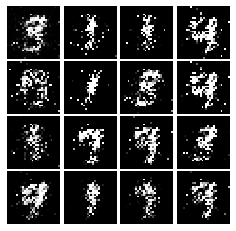

Epoch: 3, Iter: 1580, D: 0.1491, G:0.3521


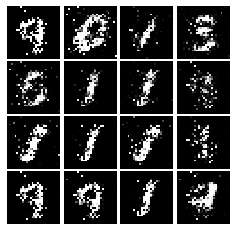

Epoch: 3, Iter: 1600, D: 0.1886, G:0.2366


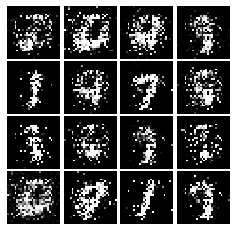

Epoch: 3, Iter: 1620, D: 0.1669, G:0.2589


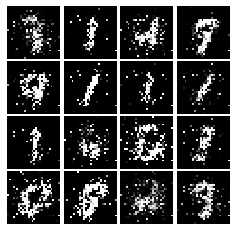

Epoch: 3, Iter: 1640, D: 0.1663, G:0.2762


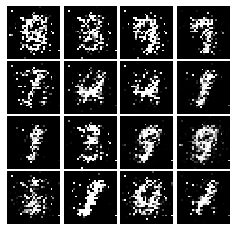

Epoch: 3, Iter: 1660, D: 0.1828, G:0.3593


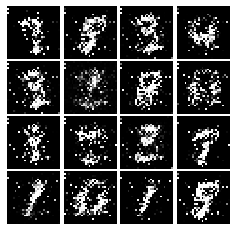

Epoch: 3, Iter: 1680, D: 0.1602, G:0.2534


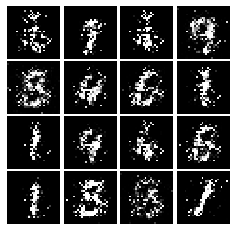

Epoch: 3, Iter: 1700, D: 0.1655, G:0.2359


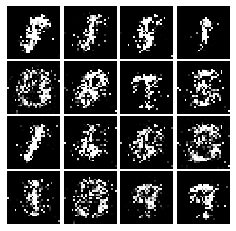

Epoch: 3, Iter: 1720, D: 0.14, G:0.3472


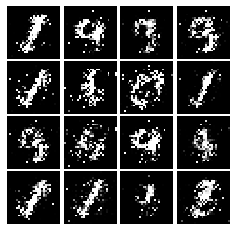

Epoch: 3, Iter: 1740, D: 0.1859, G:0.3871


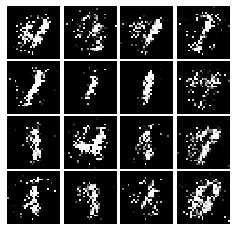

Epoch: 3, Iter: 1760, D: 0.115, G:0.3982


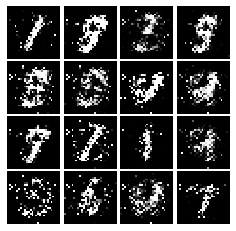

Epoch: 3, Iter: 1780, D: 0.1515, G:0.2758


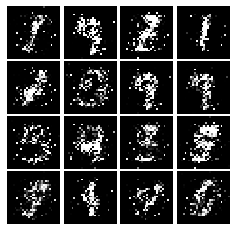

Epoch: 3, Iter: 1800, D: 0.1985, G:0.2187


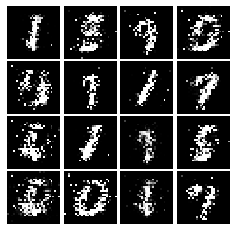

Epoch: 3, Iter: 1820, D: 0.2125, G:0.202


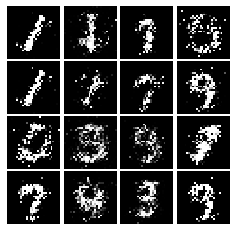

Epoch: 3, Iter: 1840, D: 0.1995, G:0.2147


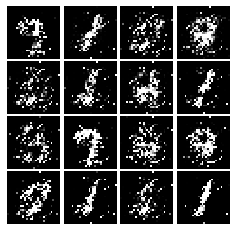

Epoch: 3, Iter: 1860, D: 0.1573, G:0.3023


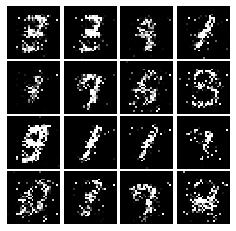

Epoch: 4, Iter: 1880, D: 0.1584, G:0.3321


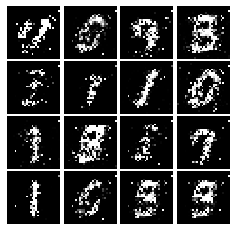

Epoch: 4, Iter: 1900, D: 0.1747, G:0.2797


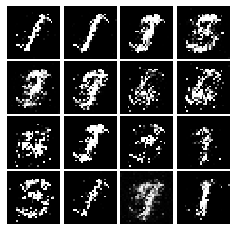

Epoch: 4, Iter: 1920, D: 0.2095, G:0.2297


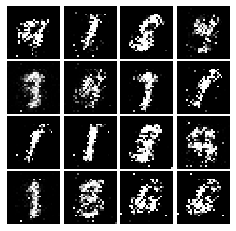

Epoch: 4, Iter: 1940, D: 0.1616, G:0.2283


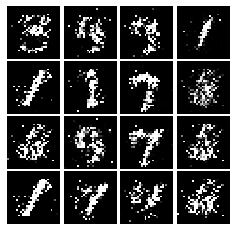

Epoch: 4, Iter: 1960, D: 0.1803, G:0.2725


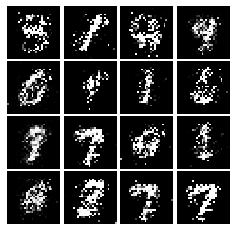

Epoch: 4, Iter: 1980, D: 0.1788, G:0.1976


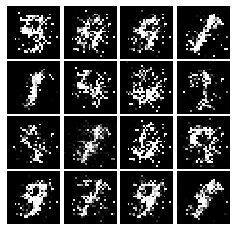

Epoch: 4, Iter: 2000, D: 0.1538, G:0.3165


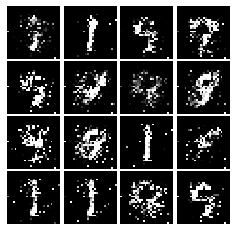

Epoch: 4, Iter: 2020, D: 0.1699, G:0.2577


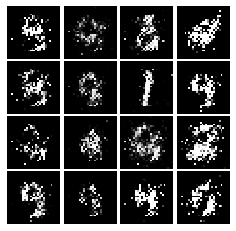

Epoch: 4, Iter: 2040, D: 0.1869, G:0.2895


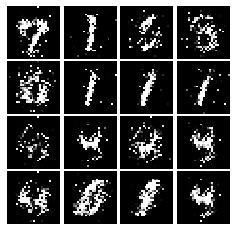

Epoch: 4, Iter: 2060, D: 0.1976, G:0.2036


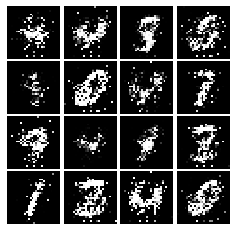

Epoch: 4, Iter: 2080, D: 0.1782, G:0.204


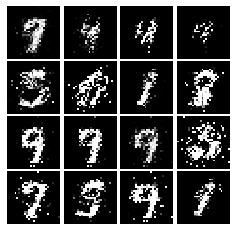

Epoch: 4, Iter: 2100, D: 0.1905, G:0.2318


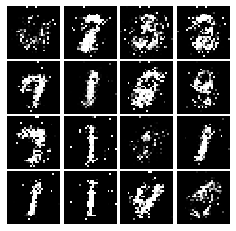

Epoch: 4, Iter: 2120, D: 0.2096, G:0.1646


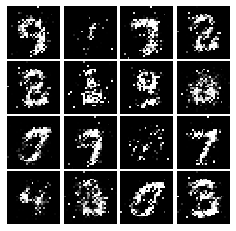

Epoch: 4, Iter: 2140, D: 0.183, G:0.2384


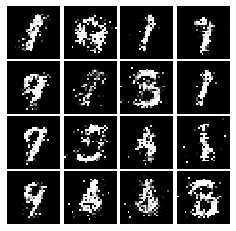

Epoch: 4, Iter: 2160, D: 0.182, G:0.2627


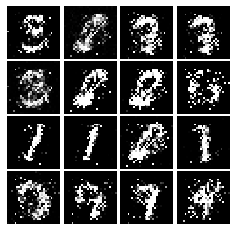

Epoch: 4, Iter: 2180, D: 0.1925, G:0.2203


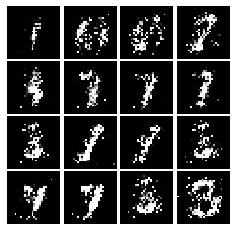

Epoch: 4, Iter: 2200, D: 0.1726, G:0.2731


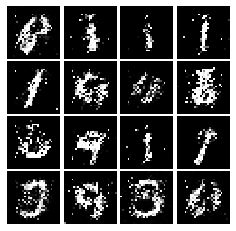

Epoch: 4, Iter: 2220, D: 0.1836, G:0.2267


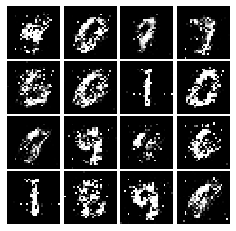

Epoch: 4, Iter: 2240, D: 0.192, G:0.2113


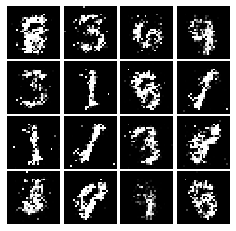

Epoch: 4, Iter: 2260, D: 0.2192, G:0.2103


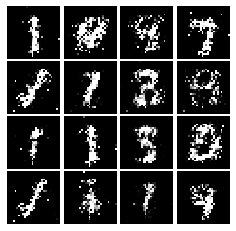

Epoch: 4, Iter: 2280, D: 0.1976, G:0.2546


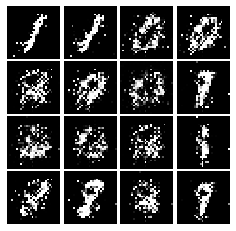

Epoch: 4, Iter: 2300, D: 0.2084, G:0.2635


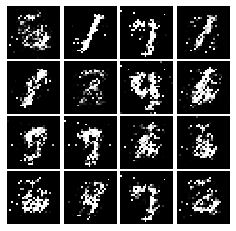

Epoch: 4, Iter: 2320, D: 0.1871, G:0.2172


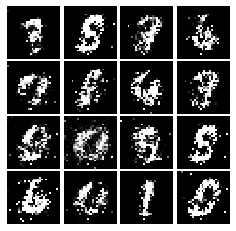

Epoch: 4, Iter: 2340, D: 0.2041, G:0.2012


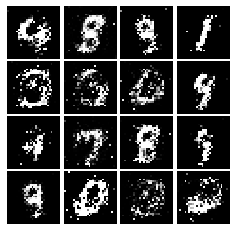

Epoch: 5, Iter: 2360, D: 0.2109, G:0.2069


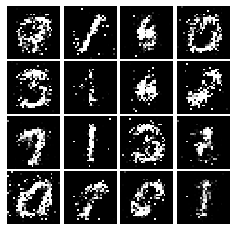

Epoch: 5, Iter: 2380, D: 0.2176, G:0.3162


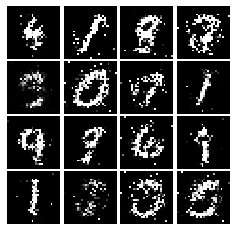

Epoch: 5, Iter: 2400, D: 0.1954, G:0.2279


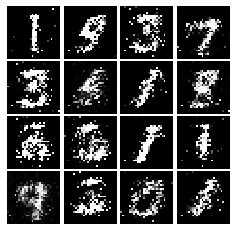

Epoch: 5, Iter: 2420, D: 0.1692, G:0.2239


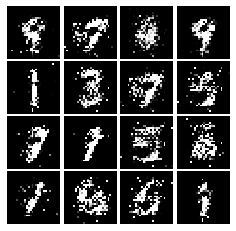

Epoch: 5, Iter: 2440, D: 0.1817, G:0.2301


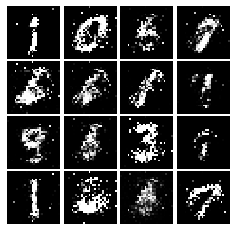

Epoch: 5, Iter: 2460, D: 0.2078, G:0.1788


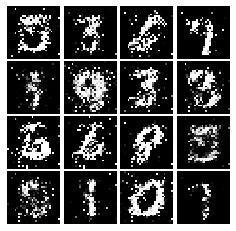

Epoch: 5, Iter: 2480, D: 0.2144, G:0.2148


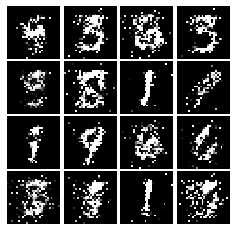

Epoch: 5, Iter: 2500, D: 0.2123, G:0.2036


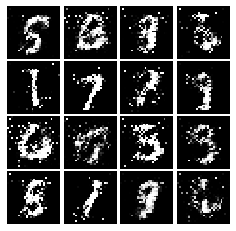

Epoch: 5, Iter: 2520, D: 0.2464, G:0.1598


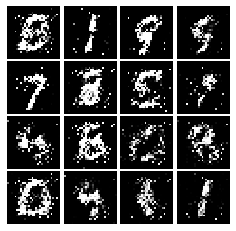

Epoch: 5, Iter: 2540, D: 0.2122, G:0.1765


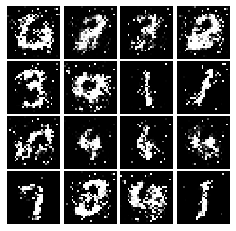

Epoch: 5, Iter: 2560, D: 0.2069, G:0.1927


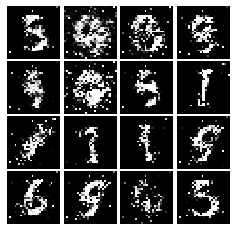

Epoch: 5, Iter: 2580, D: 0.2054, G:0.7324


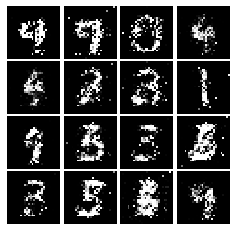

Epoch: 5, Iter: 2600, D: 0.2525, G:0.1614


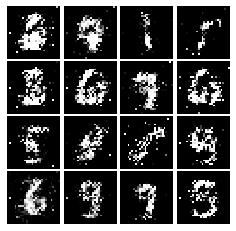

Epoch: 5, Iter: 2620, D: 0.2088, G:0.1812


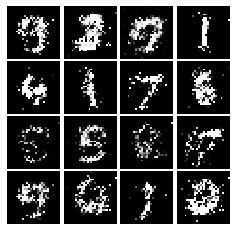

Epoch: 5, Iter: 2640, D: 0.2227, G:0.2441


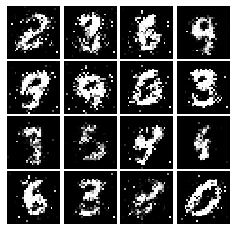

Epoch: 5, Iter: 2660, D: 0.213, G:0.1108


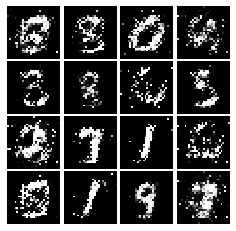

Epoch: 5, Iter: 2680, D: 0.2258, G:0.1911


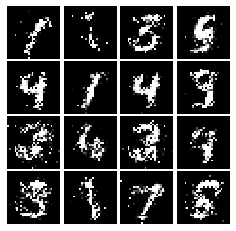

Epoch: 5, Iter: 2700, D: 0.2205, G:0.1759


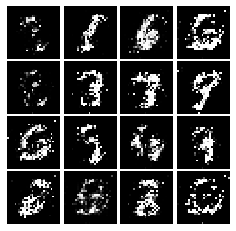

Epoch: 5, Iter: 2720, D: 0.2058, G:0.1676


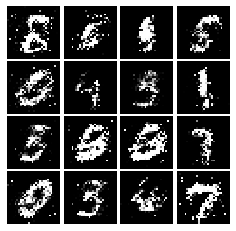

Epoch: 5, Iter: 2740, D: 0.2117, G:0.1708


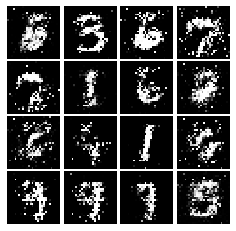

Epoch: 5, Iter: 2760, D: 0.2326, G:0.1923


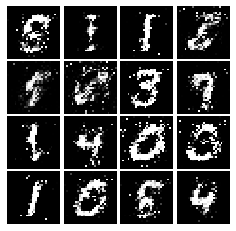

Epoch: 5, Iter: 2780, D: 0.2164, G:0.1769


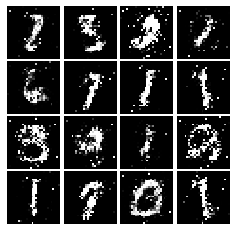

Epoch: 5, Iter: 2800, D: 0.2262, G:0.1632


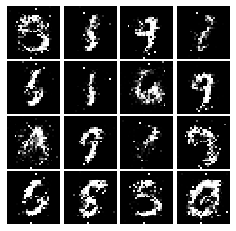

Epoch: 6, Iter: 2820, D: 0.213, G:0.1965


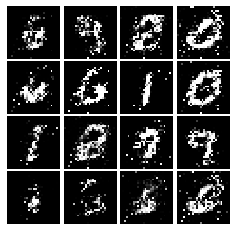

Epoch: 6, Iter: 2840, D: 0.2208, G:0.1739


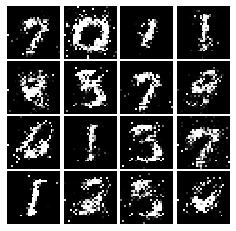

Epoch: 6, Iter: 2860, D: 0.1958, G:0.2036


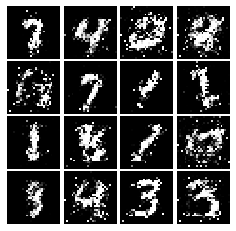

Epoch: 6, Iter: 2880, D: 0.2549, G:0.1813


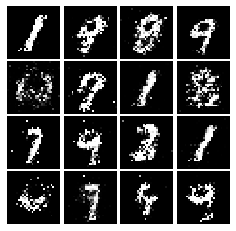

Epoch: 6, Iter: 2900, D: 0.2028, G:0.1982


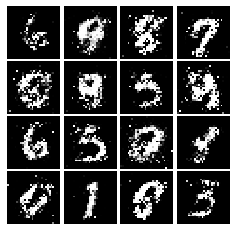

Epoch: 6, Iter: 2920, D: 0.2637, G:0.24


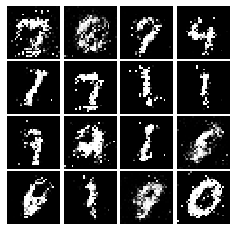

Epoch: 6, Iter: 2940, D: 0.207, G:0.2271


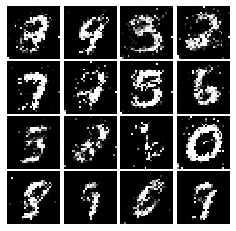

Epoch: 6, Iter: 2960, D: 0.2117, G:0.1784


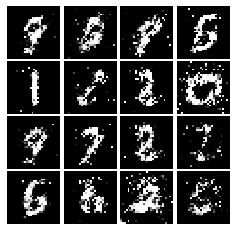

Epoch: 6, Iter: 2980, D: 0.2178, G:0.1691


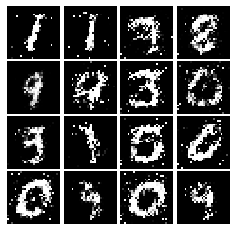

Epoch: 6, Iter: 3000, D: 0.2114, G:0.2158


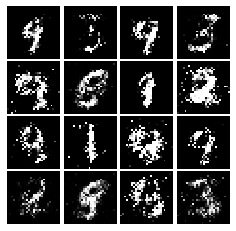

Epoch: 6, Iter: 3020, D: 0.2074, G:0.1927


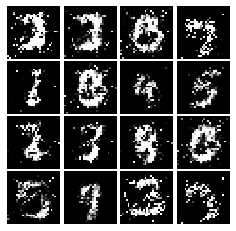

Epoch: 6, Iter: 3040, D: 0.2315, G:0.1926


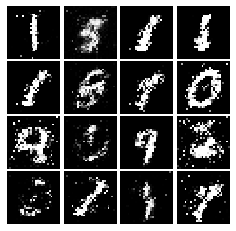

Epoch: 6, Iter: 3060, D: 0.2081, G:0.152


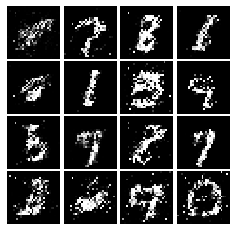

Epoch: 6, Iter: 3080, D: 0.2368, G:0.1836


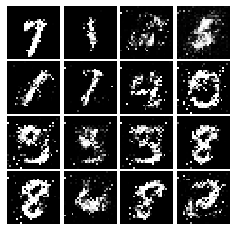

Epoch: 6, Iter: 3100, D: 0.2417, G:0.2009


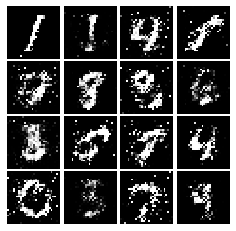

Epoch: 6, Iter: 3120, D: 0.2028, G:0.1864


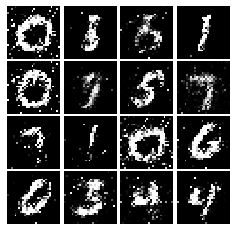

Epoch: 6, Iter: 3140, D: 0.2545, G:0.1704


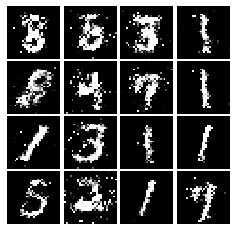

Epoch: 6, Iter: 3160, D: 0.2228, G:0.1755


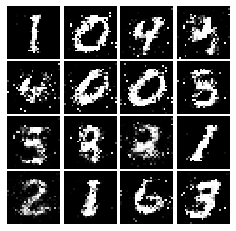

Epoch: 6, Iter: 3180, D: 0.2066, G:0.1809


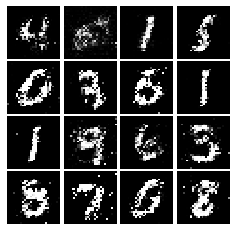

Epoch: 6, Iter: 3200, D: 0.2102, G:0.1805


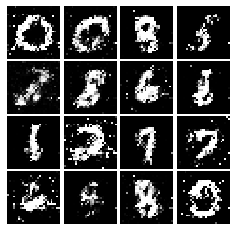

Epoch: 6, Iter: 3220, D: 0.2147, G:0.175


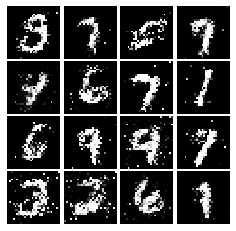

Epoch: 6, Iter: 3240, D: 0.2101, G:0.1517


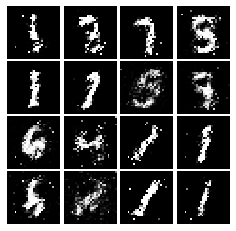

Epoch: 6, Iter: 3260, D: 0.253, G:0.1926


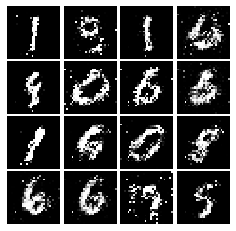

Epoch: 6, Iter: 3280, D: 0.1991, G:0.1873


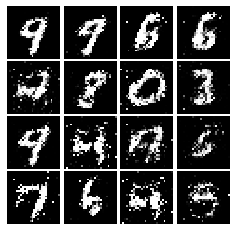

Epoch: 7, Iter: 3300, D: 0.2056, G:0.18


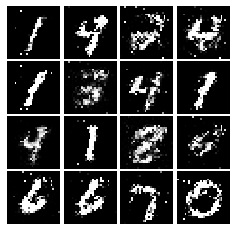

Epoch: 7, Iter: 3320, D: 0.2054, G:0.1876


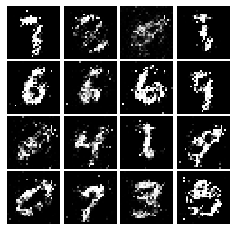

Epoch: 7, Iter: 3340, D: 0.2076, G:0.2011


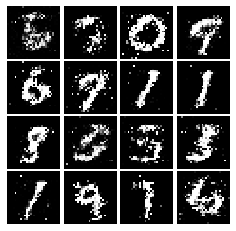

Epoch: 7, Iter: 3360, D: 0.2218, G:0.16


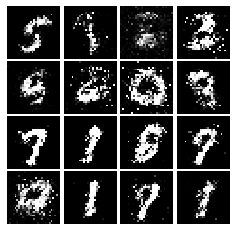

Epoch: 7, Iter: 3380, D: 0.2338, G:0.2166


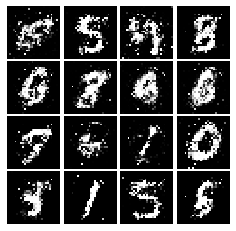

Epoch: 7, Iter: 3400, D: 0.2352, G:0.1513


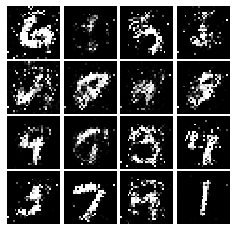

Epoch: 7, Iter: 3420, D: 0.2378, G:0.1789


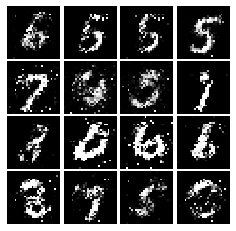

Epoch: 7, Iter: 3440, D: 0.2369, G:0.1921


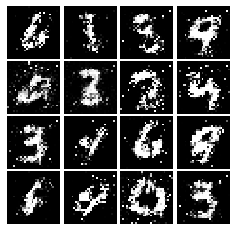

Epoch: 7, Iter: 3460, D: 0.2101, G:0.1895


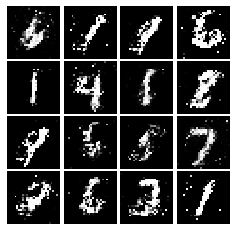

Epoch: 7, Iter: 3480, D: 0.2133, G:0.1641


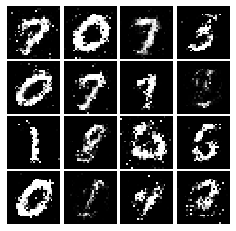

Epoch: 7, Iter: 3500, D: 0.2211, G:0.1633


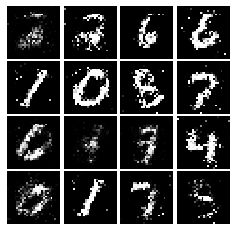

Epoch: 7, Iter: 3520, D: 0.2168, G:0.1579


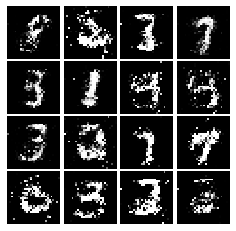

Epoch: 7, Iter: 3540, D: 0.215, G:0.1963


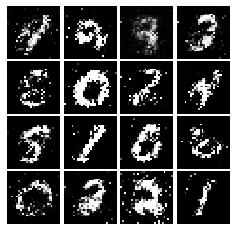

Epoch: 7, Iter: 3560, D: 0.2349, G:0.2251


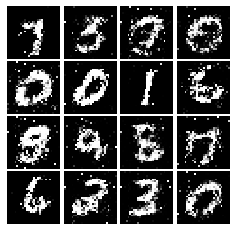

Epoch: 7, Iter: 3580, D: 0.2508, G:0.1778


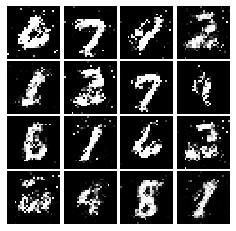

Epoch: 7, Iter: 3600, D: 0.2313, G:0.2002


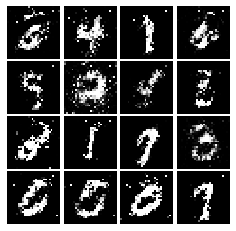

Epoch: 7, Iter: 3620, D: 0.2242, G:0.1554


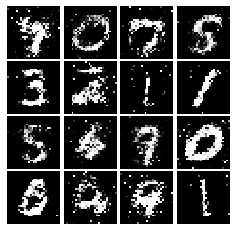

Epoch: 7, Iter: 3640, D: 0.2337, G:0.1688


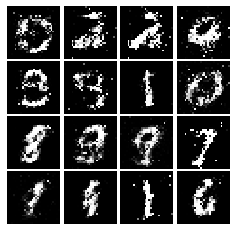

Epoch: 7, Iter: 3660, D: 0.2152, G:0.1773


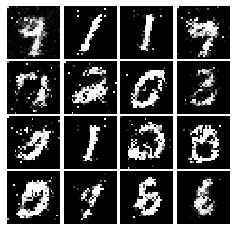

Epoch: 7, Iter: 3680, D: 0.2242, G:0.1994


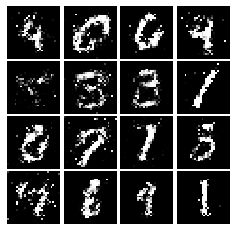

Epoch: 7, Iter: 3700, D: 0.2158, G:0.1874


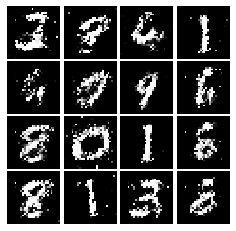

Epoch: 7, Iter: 3720, D: 0.1994, G:0.1898


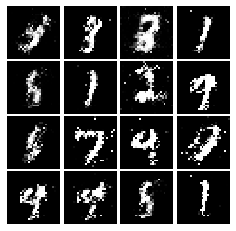

Epoch: 7, Iter: 3740, D: 0.2197, G:0.1525


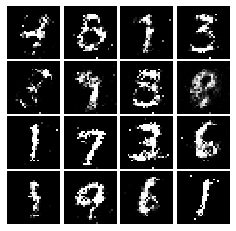

Epoch: 8, Iter: 3760, D: 0.2349, G:0.1895


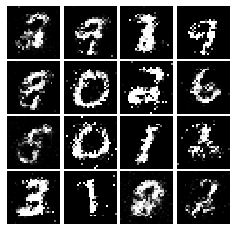

Epoch: 8, Iter: 3780, D: 0.2607, G:0.1763


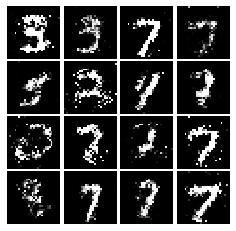

Epoch: 8, Iter: 3800, D: 0.2391, G:0.1668


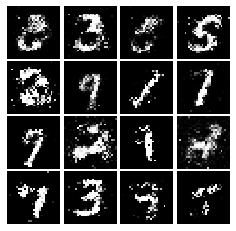

Epoch: 8, Iter: 3820, D: 0.2415, G:0.1642


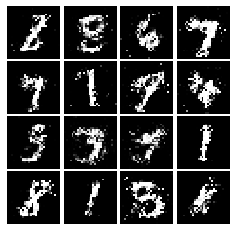

Epoch: 8, Iter: 3840, D: 0.2285, G:0.1715


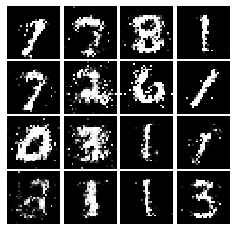

Epoch: 8, Iter: 3860, D: 0.2441, G:0.1795


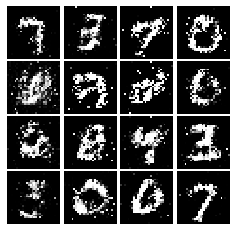

Epoch: 8, Iter: 3880, D: 0.2396, G:0.1562


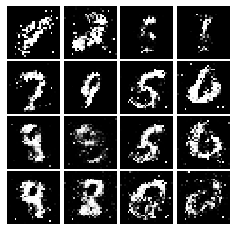

Epoch: 8, Iter: 3900, D: 0.2365, G:0.1606


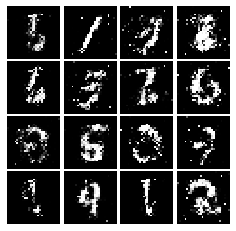

Epoch: 8, Iter: 3920, D: 0.2335, G:0.1695


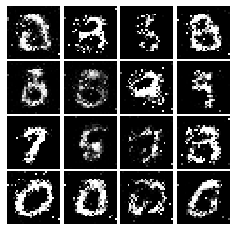

Epoch: 8, Iter: 3940, D: 0.2357, G:0.1465


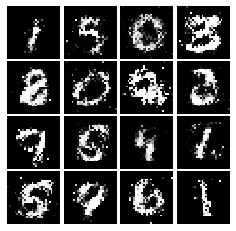

Epoch: 8, Iter: 3960, D: 0.2539, G:0.1711


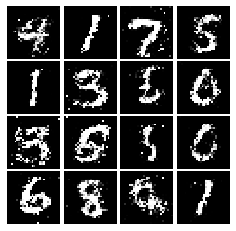

Epoch: 8, Iter: 3980, D: 0.2357, G:0.1796


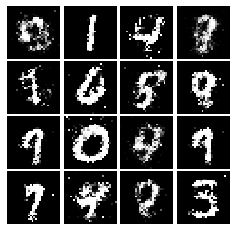

Epoch: 8, Iter: 4000, D: 0.2184, G:0.1553


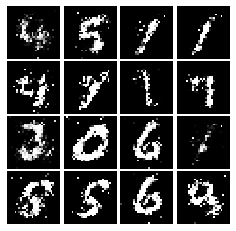

Epoch: 8, Iter: 4020, D: 0.2232, G:0.1697


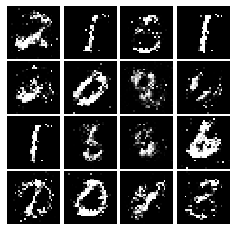

Epoch: 8, Iter: 4040, D: 0.2227, G:0.1601


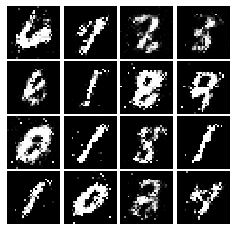

Epoch: 8, Iter: 4060, D: 0.216, G:0.1621


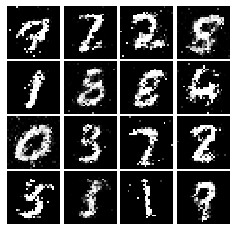

Epoch: 8, Iter: 4080, D: 0.2329, G:0.1858


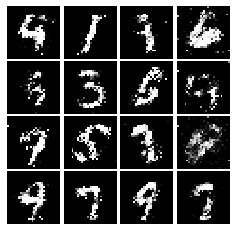

Epoch: 8, Iter: 4100, D: 0.2437, G:0.1558


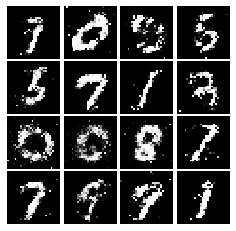

Epoch: 8, Iter: 4120, D: 0.2336, G:0.172


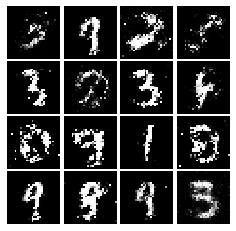

Epoch: 8, Iter: 4140, D: 0.2193, G:0.1853


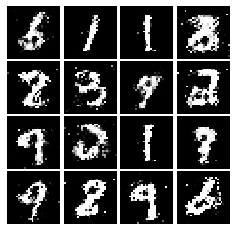

Epoch: 8, Iter: 4160, D: 0.2329, G:0.1579


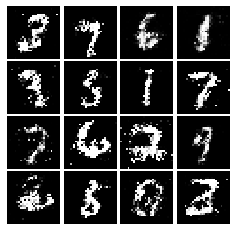

Epoch: 8, Iter: 4180, D: 0.2393, G:0.1726


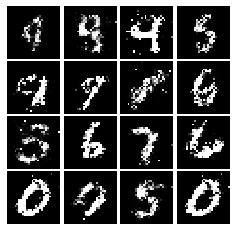

Epoch: 8, Iter: 4200, D: 0.2316, G:0.1488


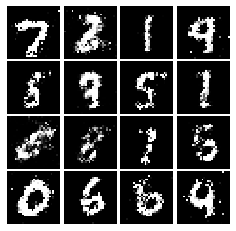

Epoch: 8, Iter: 4220, D: 0.2662, G:0.1713


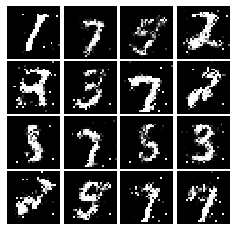

Epoch: 9, Iter: 4240, D: 0.2461, G:0.162


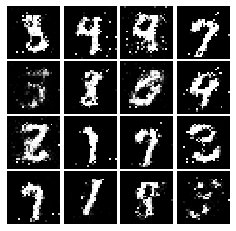

Epoch: 9, Iter: 4260, D: 0.2472, G:0.1549


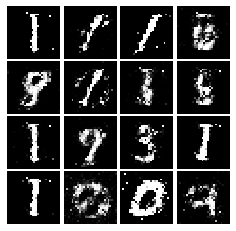

Epoch: 9, Iter: 4280, D: 0.2464, G:0.1565


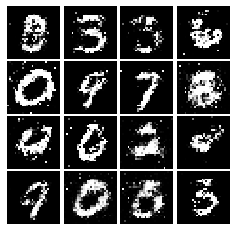

Epoch: 9, Iter: 4300, D: 0.2288, G:0.1481


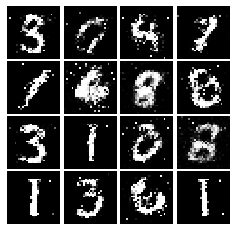

Epoch: 9, Iter: 4320, D: 0.2279, G:0.159


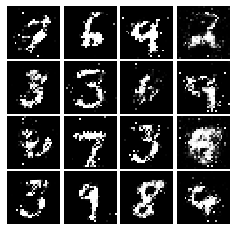

Epoch: 9, Iter: 4340, D: 0.2373, G:0.1597


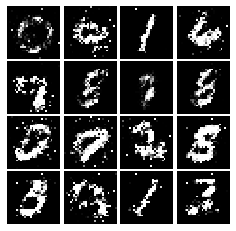

Epoch: 9, Iter: 4360, D: 0.2185, G:0.156


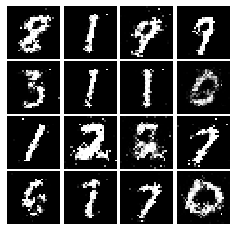

Epoch: 9, Iter: 4380, D: 0.2549, G:0.1843


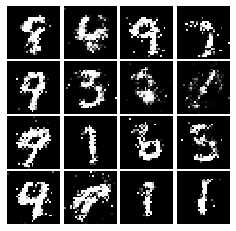

Epoch: 9, Iter: 4400, D: 0.1958, G:0.1888


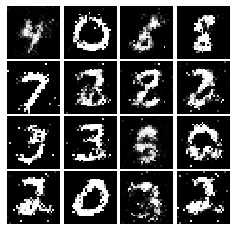

Epoch: 9, Iter: 4420, D: 0.2309, G:0.1726


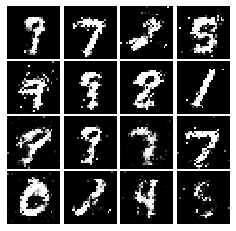

Epoch: 9, Iter: 4440, D: 0.2412, G:0.153


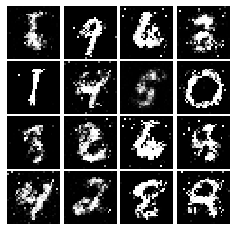

Epoch: 9, Iter: 4460, D: 0.2305, G:0.1586


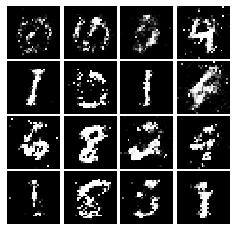

Epoch: 9, Iter: 4480, D: 0.2244, G:0.1703


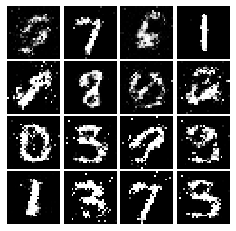

Epoch: 9, Iter: 4500, D: 0.2582, G:0.1709


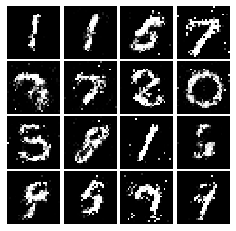

Epoch: 9, Iter: 4520, D: 0.246, G:0.1618


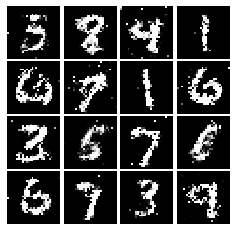

Epoch: 9, Iter: 4540, D: 0.2337, G:0.1652


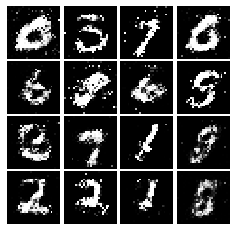

Epoch: 9, Iter: 4560, D: 0.2386, G:0.1392


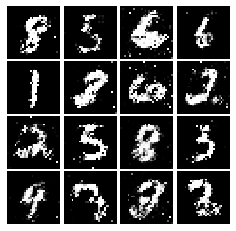

Epoch: 9, Iter: 4580, D: 0.2374, G:0.1694


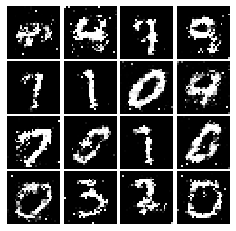

Epoch: 9, Iter: 4600, D: 0.2243, G:0.1902


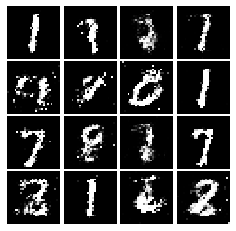

Epoch: 9, Iter: 4620, D: 0.2363, G:0.1547


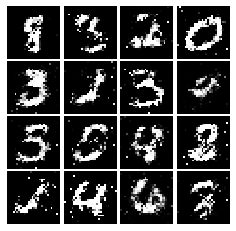

Epoch: 9, Iter: 4640, D: 0.226, G:0.1531


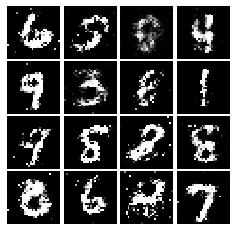

Epoch: 9, Iter: 4660, D: 0.2194, G:0.1619


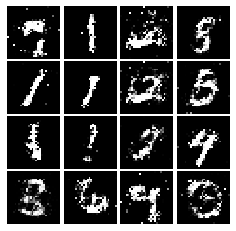

Epoch: 9, Iter: 4680, D: 0.215, G:0.1629


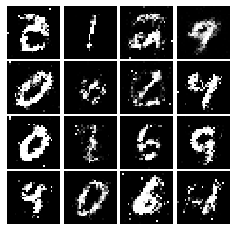

Final images


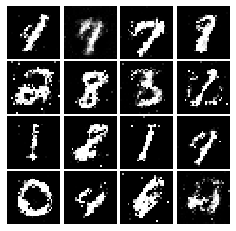

In [21]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [22]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.Reshape((28, 28, 1), input_shape=(784,)),
        tf.keras.layers.Conv2D(32, 5),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.MaxPool2D(2, 2),
        tf.keras.layers.Conv2D(64, 5),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.MaxPool2D(2, 2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(1024), # 4 x 4 x 64
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(1),
        

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [23]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential()
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    model.add(tf.keras.layers.Dense(1024, input_shape=(noise_dim,)))
    model.add(tf.keras.layers.ReLU())
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Dense(6272)) # 7 x 7 x 128
    model.add(tf.keras.layers.ReLU())
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Reshape((7, 7, 128)))
    model.add(tf.keras.layers.Conv2DTranspose(64, 4, 2, padding='same'))
    model.add(tf.keras.layers.ReLU())
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.Conv2DTranspose(1, 4, 2, padding='same'))
    model.add(tf.keras.layers.Activation('tanh'))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.462, G:0.6512


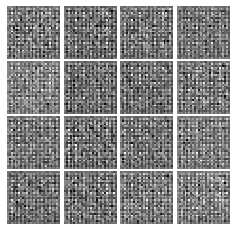

Epoch: 0, Iter: 20, D: 0.1495, G:2.337


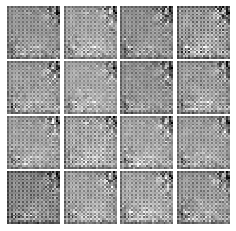

Epoch: 0, Iter: 40, D: 0.003423, G:5.771


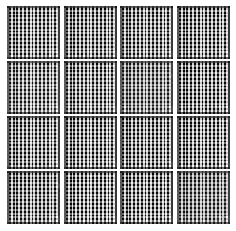

Epoch: 0, Iter: 60, D: 0.001202, G:6.779


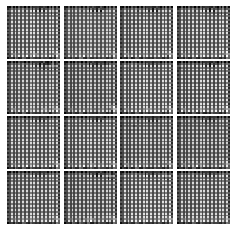

Epoch: 0, Iter: 80, D: 0.0007023, G:7.374


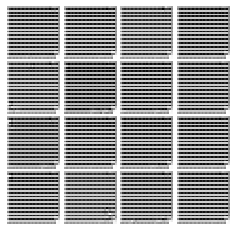

Epoch: 0, Iter: 100, D: 0.0003782, G:7.906


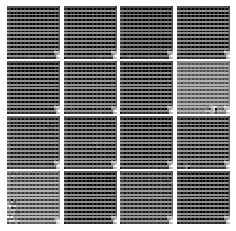

Epoch: 0, Iter: 120, D: 0.0002562, G:8.29


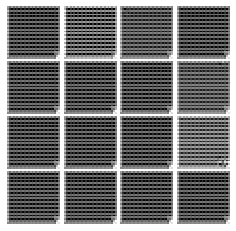

Epoch: 0, Iter: 140, D: 0.0002122, G:8.487


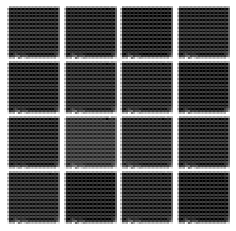

Epoch: 0, Iter: 160, D: 0.002015, G:8.253


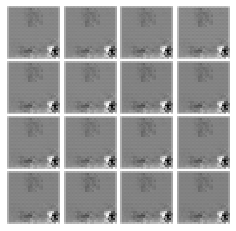

Epoch: 0, Iter: 180, D: 1.129, G:1.757


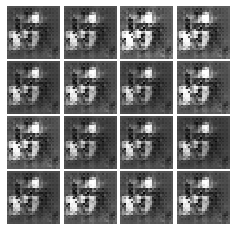

Epoch: 0, Iter: 200, D: 1.387, G:0.7147


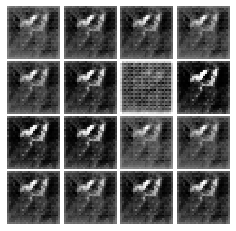

Epoch: 0, Iter: 220, D: 0.6994, G:3.806


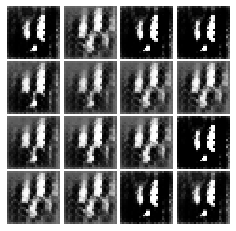

Epoch: 0, Iter: 240, D: 0.8416, G:1.197


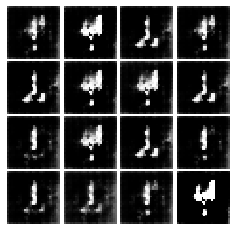

Epoch: 0, Iter: 260, D: 1.249, G:1.8


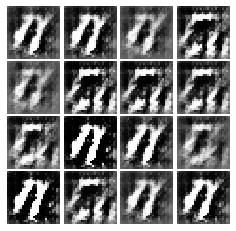

Epoch: 0, Iter: 280, D: 0.8336, G:1.138


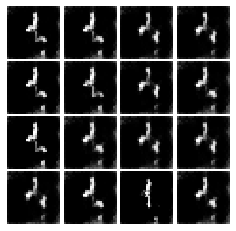

Epoch: 0, Iter: 300, D: 1.69, G:0.9617


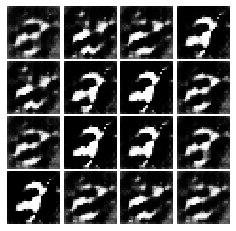

Epoch: 0, Iter: 320, D: 0.7853, G:4.371


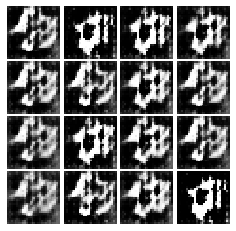

Epoch: 0, Iter: 340, D: 0.8664, G:1.262


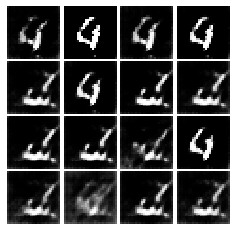

Epoch: 0, Iter: 360, D: 1.198, G:2.25


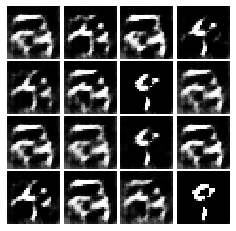

Epoch: 0, Iter: 380, D: 0.8144, G:1.433


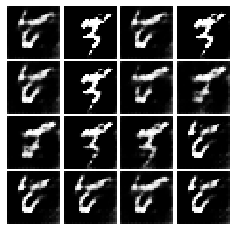

Epoch: 0, Iter: 400, D: 1.19, G:1.451


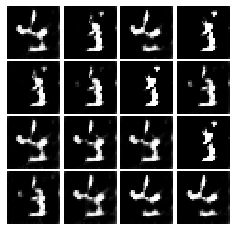

Epoch: 0, Iter: 420, D: 0.6744, G:2.357


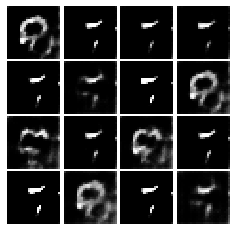

Epoch: 0, Iter: 440, D: 0.9935, G:1.702


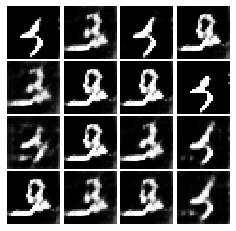

Epoch: 0, Iter: 460, D: 0.5109, G:3.143


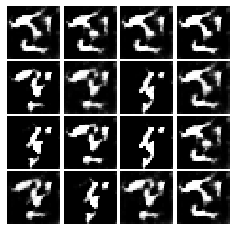

Epoch: 1, Iter: 480, D: 0.7211, G:1.688


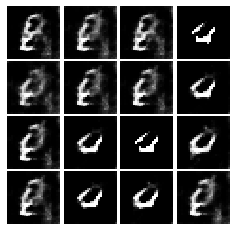

Epoch: 1, Iter: 500, D: 1.014, G:1.713


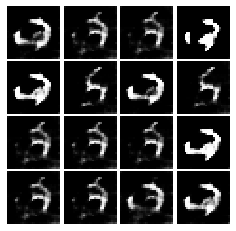

Epoch: 1, Iter: 520, D: 0.5548, G:2.637


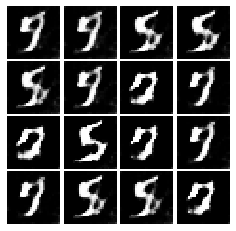

Epoch: 1, Iter: 540, D: 0.2536, G:2.909


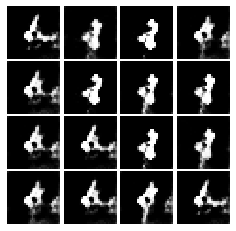

Epoch: 1, Iter: 560, D: 1.003, G:3.657


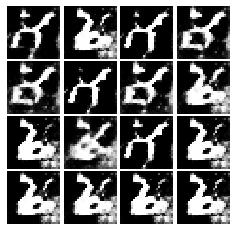

Epoch: 1, Iter: 580, D: 0.987, G:2.601


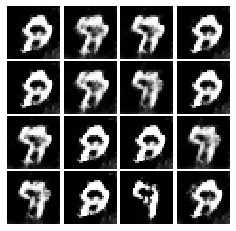

Epoch: 1, Iter: 600, D: 0.6525, G:1.874


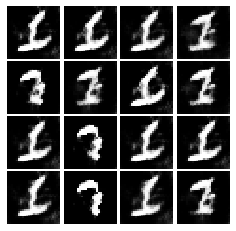

Epoch: 1, Iter: 620, D: 0.8929, G:4.849


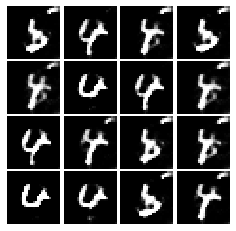

Epoch: 1, Iter: 640, D: 0.7752, G:1.88


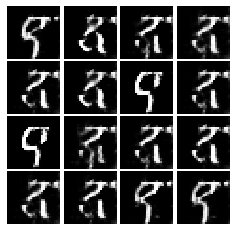

Epoch: 1, Iter: 660, D: 0.575, G:2.037


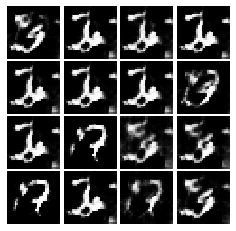

Epoch: 1, Iter: 680, D: 0.4047, G:3.372


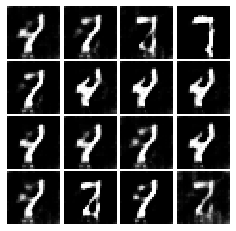

Epoch: 1, Iter: 700, D: 0.315, G:3.368


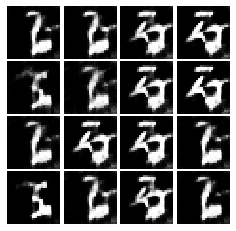

Epoch: 1, Iter: 720, D: 0.7769, G:2.194


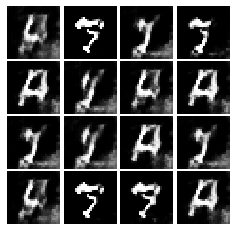

Epoch: 1, Iter: 740, D: 0.7001, G:1.784


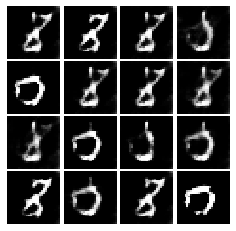

Epoch: 1, Iter: 760, D: 0.3229, G:3.794


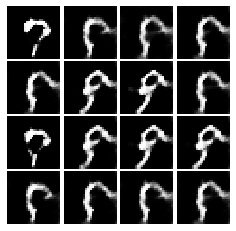

Epoch: 1, Iter: 780, D: 0.418, G:3.11


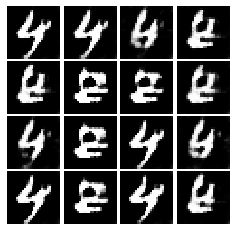

Epoch: 1, Iter: 800, D: 0.1647, G:4.023


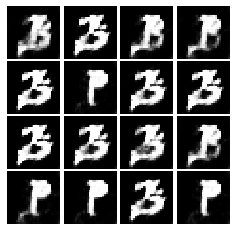

Epoch: 1, Iter: 820, D: 0.2773, G:3.696


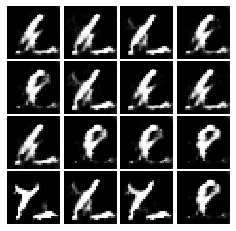

Epoch: 1, Iter: 840, D: 1.461, G:6.229


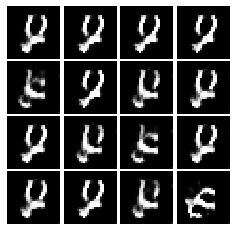

Epoch: 1, Iter: 860, D: 0.5199, G:4.374


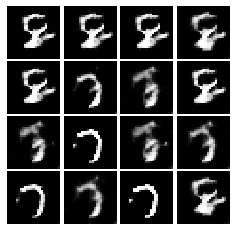

Epoch: 1, Iter: 880, D: 0.3349, G:3.609


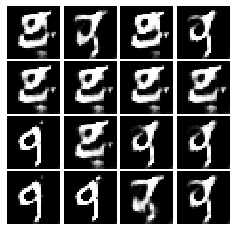

Epoch: 1, Iter: 900, D: 0.7687, G:2.393


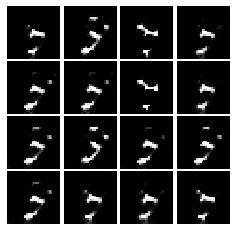

Epoch: 1, Iter: 920, D: 0.2388, G:4.342


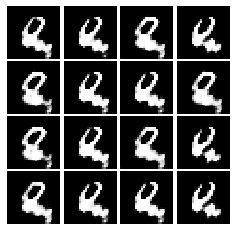

Epoch: 2, Iter: 940, D: 0.559, G:2.509


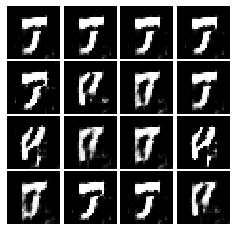

Epoch: 2, Iter: 960, D: 0.5885, G:3.015


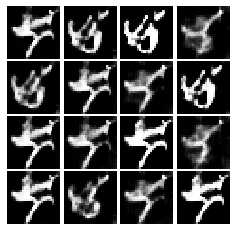

Epoch: 2, Iter: 980, D: 0.6782, G:2.363


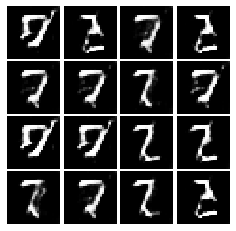

Epoch: 2, Iter: 1000, D: 0.591, G:2.119


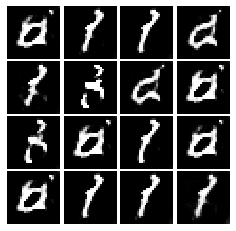

Epoch: 2, Iter: 1020, D: 0.4889, G:3.332


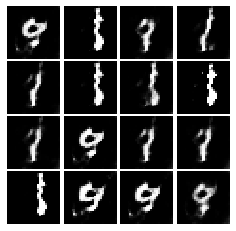

Epoch: 2, Iter: 1040, D: 0.4627, G:2.093


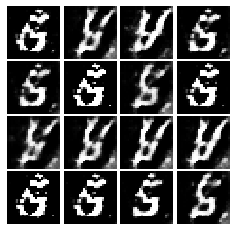

Epoch: 2, Iter: 1060, D: 0.2578, G:2.825


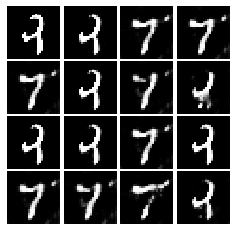

Epoch: 2, Iter: 1080, D: 0.3607, G:3.723


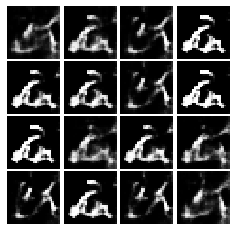

Epoch: 2, Iter: 1100, D: 0.5884, G:3.362


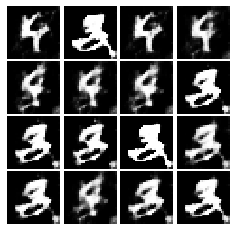

Epoch: 2, Iter: 1120, D: 0.5194, G:3.181


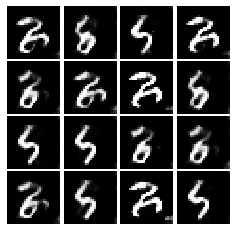

Epoch: 2, Iter: 1140, D: 0.7854, G:2.112


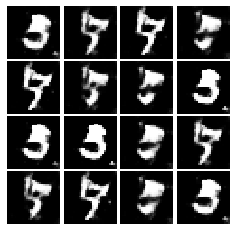

Epoch: 2, Iter: 1160, D: 0.1999, G:4.249


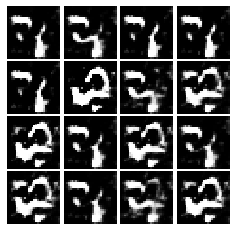

Epoch: 2, Iter: 1180, D: 0.2344, G:4.105


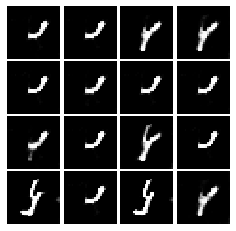

Epoch: 2, Iter: 1200, D: 0.3416, G:2.948


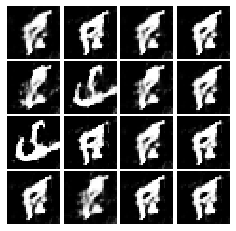

Epoch: 2, Iter: 1220, D: 0.7374, G:3.659


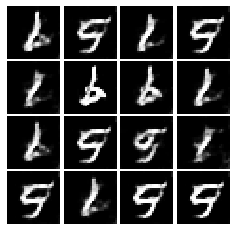

Epoch: 2, Iter: 1240, D: 0.4331, G:3.478


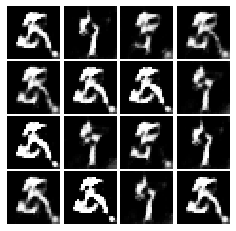

Epoch: 2, Iter: 1260, D: 0.5125, G:3.901


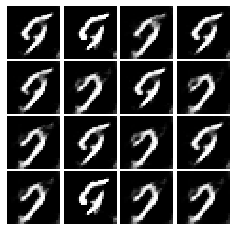

Epoch: 2, Iter: 1280, D: 0.3784, G:3.16


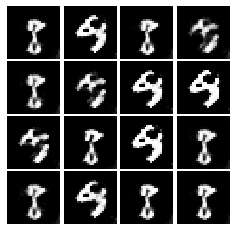

Epoch: 2, Iter: 1300, D: 0.1943, G:4.267


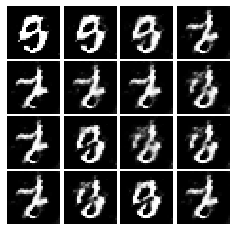

Epoch: 2, Iter: 1320, D: 0.5451, G:2.611


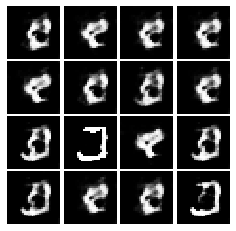

Epoch: 2, Iter: 1340, D: 0.3944, G:3.276


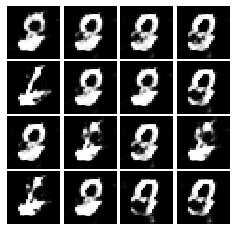

Epoch: 2, Iter: 1360, D: 3.62, G:3.907


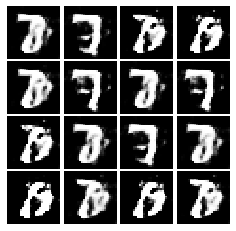

Epoch: 2, Iter: 1380, D: 0.4586, G:2.379


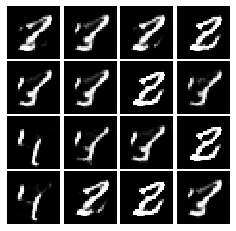

Epoch: 2, Iter: 1400, D: 0.4768, G:2.535


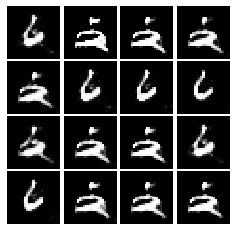

Epoch: 3, Iter: 1420, D: 1.001, G:2.317


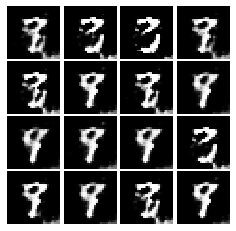

Epoch: 3, Iter: 1440, D: 0.474, G:2.698


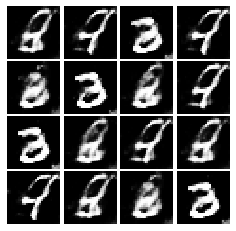

Epoch: 3, Iter: 1460, D: 0.4686, G:3.355


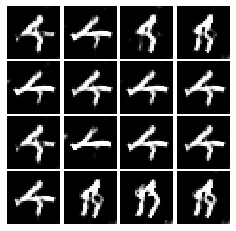

Epoch: 3, Iter: 1480, D: 0.7048, G:4.523


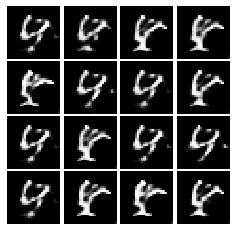

Epoch: 3, Iter: 1500, D: 0.6769, G:5.186


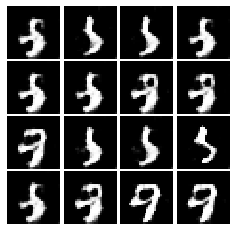

Epoch: 3, Iter: 1520, D: 0.6242, G:2.297


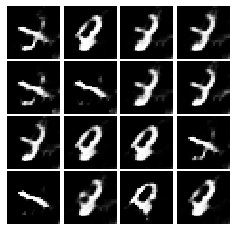

Epoch: 3, Iter: 1540, D: 0.7523, G:2.396


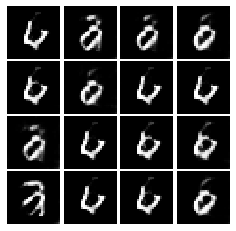

Epoch: 3, Iter: 1560, D: 0.5223, G:4.024


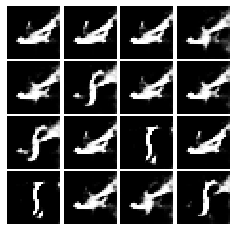

Epoch: 3, Iter: 1580, D: 0.6114, G:2.131


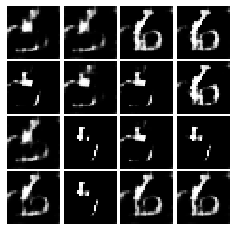

Epoch: 3, Iter: 1600, D: 0.6332, G:2.584


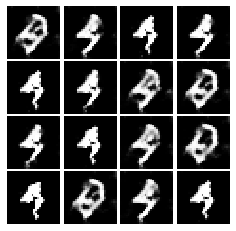

Epoch: 3, Iter: 1620, D: 0.2928, G:3.702


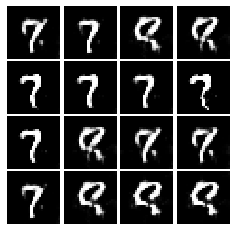

Epoch: 3, Iter: 1640, D: 0.3321, G:3.013


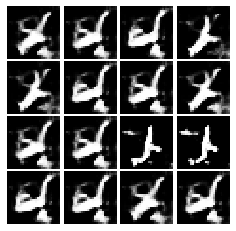

Epoch: 3, Iter: 1660, D: 0.4112, G:2.577


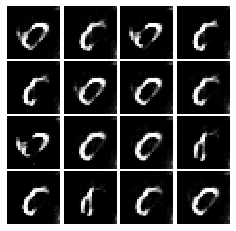

Epoch: 3, Iter: 1680, D: 0.2168, G:3.392


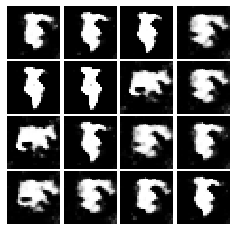

Epoch: 3, Iter: 1700, D: 0.7631, G:1.627


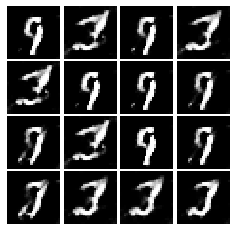

Epoch: 3, Iter: 1720, D: 0.4185, G:2.846


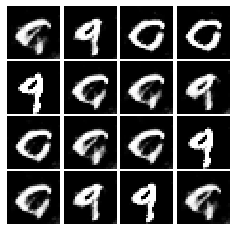

Epoch: 3, Iter: 1740, D: 0.337, G:3.441


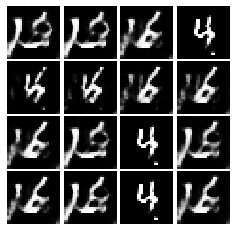

Epoch: 3, Iter: 1760, D: 0.3281, G:4.061


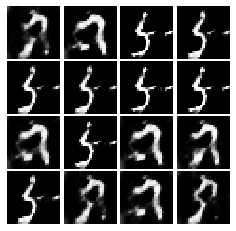

Epoch: 3, Iter: 1780, D: 0.272, G:4.671


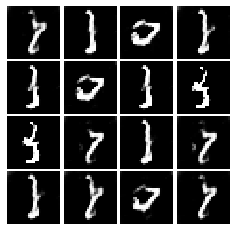

Epoch: 3, Iter: 1800, D: 0.2111, G:2.962


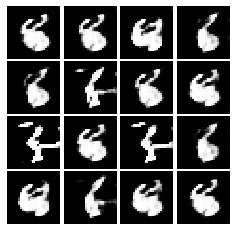

Epoch: 3, Iter: 1820, D: 0.115, G:4.092


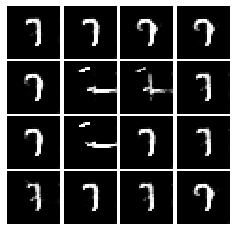

Epoch: 3, Iter: 1840, D: 0.4936, G:4.144


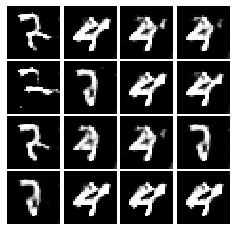

Epoch: 3, Iter: 1860, D: 0.3137, G:3.929


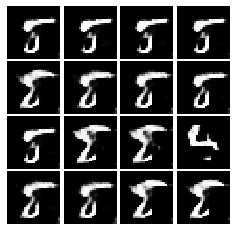

Epoch: 4, Iter: 1880, D: 0.5063, G:5.528


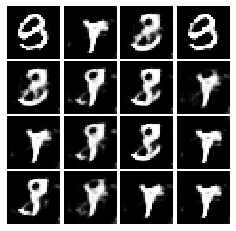

Epoch: 4, Iter: 1900, D: 0.4331, G:2.145


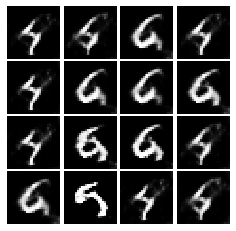

Epoch: 4, Iter: 1920, D: 0.2659, G:3.32


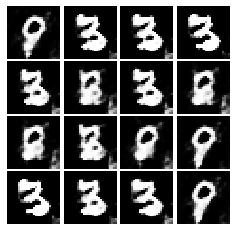

Epoch: 4, Iter: 1940, D: 0.5267, G:2.762


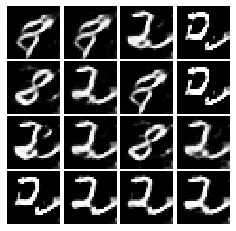

Epoch: 4, Iter: 1960, D: 0.7459, G:3.322


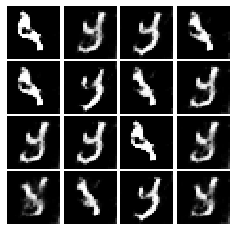

Epoch: 4, Iter: 1980, D: 0.3112, G:3.463


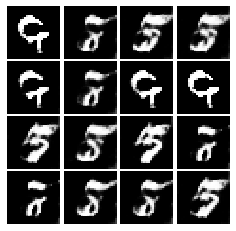

Epoch: 4, Iter: 2000, D: 0.2756, G:3.58


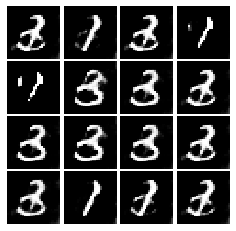

Epoch: 4, Iter: 2020, D: 0.2874, G:3.915


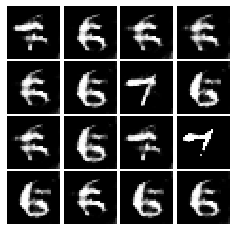

Epoch: 4, Iter: 2040, D: 0.4425, G:5.78


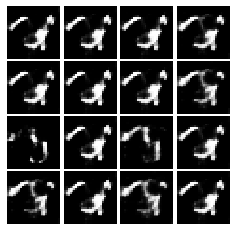

Epoch: 4, Iter: 2060, D: 0.143, G:4.645


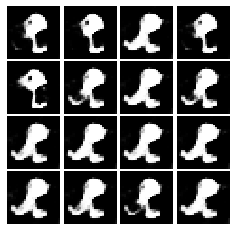

Epoch: 4, Iter: 2080, D: 0.448, G:5.321


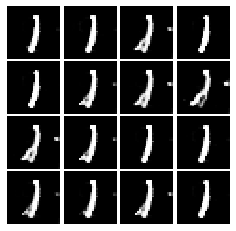

Epoch: 4, Iter: 2100, D: 0.5243, G:3.838


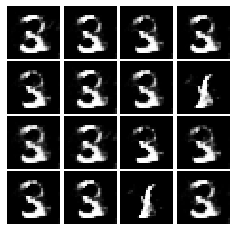

Epoch: 4, Iter: 2120, D: 0.4065, G:3.072


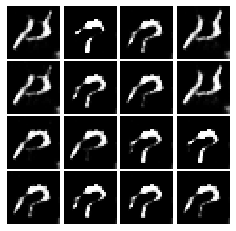

Epoch: 4, Iter: 2140, D: 0.4956, G:5.444


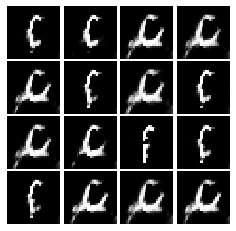

Epoch: 4, Iter: 2160, D: 0.2899, G:4.429


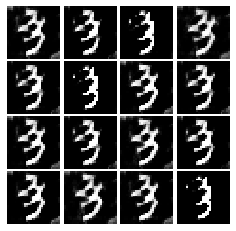

Epoch: 4, Iter: 2180, D: 0.8138, G:4.688


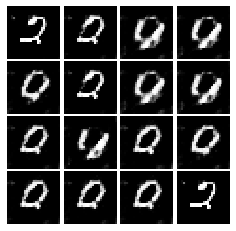

Epoch: 4, Iter: 2200, D: 0.3695, G:3.58


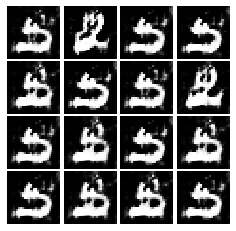

Epoch: 4, Iter: 2220, D: 0.212, G:4.126


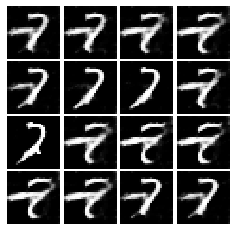

Epoch: 4, Iter: 2240, D: 0.5313, G:4.735


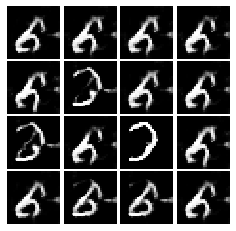

Epoch: 4, Iter: 2260, D: 0.1537, G:4.225


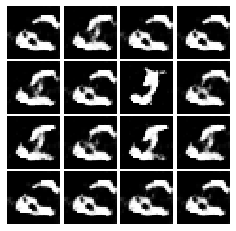

Epoch: 4, Iter: 2280, D: 0.1721, G:5.072


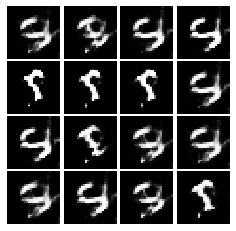

Epoch: 4, Iter: 2300, D: 3.458, G:7.09


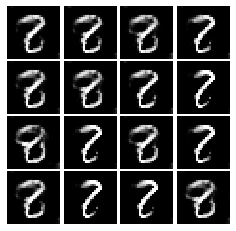

Epoch: 4, Iter: 2320, D: 0.1781, G:4.439


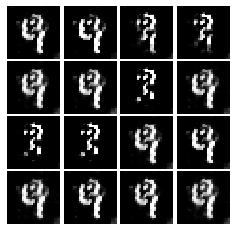

Epoch: 4, Iter: 2340, D: 0.4516, G:6.292


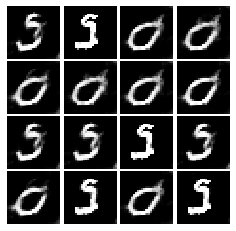

Final images


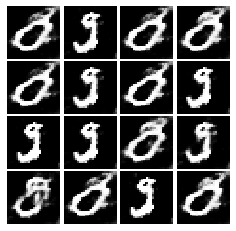

In [24]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
$
y_{t + 1} = y_t + x_t\\
x_{t + 1} = x_t - y_{t + 1}
$
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |   2   |   1   |  -1   |  -2   |  -1   |   1    
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |  -1   |  -2   |  -1   |   1   |   2   |   1   
   
After 6 steps $f(x, y) = 1$.

## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 
No, the same sequence will be repeated forever without converging into any value.

## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 


No, this means that the discriminator is not learning correctly (or is too week) and is not able to distinguish real and false images. A weak discriminator will make life too easy for the generator that won't learn much.